# Setting Up

In [34]:
# imports necessary modules
import tensorflow as tf
import numpy as np
import os
import pandas as pd
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Conv2D, Dropout, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K
import matplotlib.pyplot as plt

# set global random state
seed_value = 42
os.environ['PYTHONHASHSEED'] = str(seed_value)
import random
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

In [2]:
# Check if TensorFlow is using the Metal plugin (we're using a Macbook Air with a built in 16-core Neural Engine, want to ensure we're using that for faster runtime)
print("TensorFlow is using Metal:", tf.config.list_physical_devices('GPU'))

TensorFlow is using Metal: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Data Preprocessing

In [3]:
# ---- Global Variables ----
IMAGE_FOLDER = "images/"
SAL_MAP_FOLDER = "saliency_maps/"
CSV_FILE = 'image_types.csv'
IMG_SIZE = (224, 224, 3)

In [4]:
# ---- Data Generator ----
class DataGenerator(tf.keras.utils.Sequence):
    '''
    A custom data loader for the UI images and saliency maps, inheriting from tf.keras.utils.Sequence.
    For instance, can be used with the following methods:
        model.fit(train_data_gen, validation_data=val_data_gen, ...)
        predictions = model.predict(data_gen)
        loss, mae = model.evaluate(data_gen)
    '''
    def __init__(self, image_folder, sal_map_folder, filenames, batch_size=1, shuffle=True, sample_size=None, augmentation=None):
        '''
        Constructor:
            image_folder (str): Path to the folder containing input images.
            sal_map_folder (str): Path to the folder containing saliency maps.
            filenames (list): List of filenames to include in this generator.
            batch_size (int): Number of samples per batch.
            shuffle (bool): Whether to shuffle the data at the end of each epoch.
            sample_size (int): Number of samples to use (for debugging).
        '''
        self.image_folder = image_folder # string, path to the folder containing input images
        self.sal_map_folder = sal_map_folder # string, path to the folder containing saliency maps
        self.batch_size = batch_size # int, number of samples per batch
        self.filenames = filenames # list of filenames (shared between the input images and their corresponding saliency maps) to convert to data
        self.sample_size = sample_size
        self.shuffle = shuffle # boolean, if using random shuffle each epoch
        self.augmentation = augmentation # specified data augmentation

        # Limit the dataset to a (smaller) sample_size if specified
        if self.sample_size and self.sample_size<len(self.filenames):
            self.filenames = self.filenames[:self.sample_size]

        self.on_epoch_end() # random shuffle

    def on_epoch_end(self): # if using random shuffle each epoch
        '''If shuffle=True, shuffles the list of filenames to randomize the order of data for the next epoch (automatically called by Keras)'''
        if self.shuffle:
            np.random.shuffle(self.filenames)

    def __len__(self):
        '''Returns the number of batches per epoch'''
        return int(np.floor(len(self.filenames) / self.batch_size))

    def __getitem__(self, index):
        '''
        Generates one batch of data given the index of the batch (automatically called by Keras)
        Returns tuple (X, Y), both normalized to [0,1]
        X: batch of input images of shape (batch_size, height, width, channels)
        Y: batch of corresponding saliency maps of shape (batch_size, height, width, 1)
        
        Can be called using the [] indexing operator
        '''
        # select a subset of filenames for the current batch
        batch_files = self.filenames[index * self.batch_size:(index + 1) * self.batch_size]

        # load and preprocess the images and saliency maps for the specified batch
        return self.__data_generation(batch_files)
    
    def __data_generation(self, batch_files):
        '''
        Load and preprocess the images and saliency maps.
        Returns tuple (X, Y), both normalized to [0,1]
        X: batch of input images of shape (batch_size, height, width, channels)
        Y: batch of corresponding saliency maps of shape (batch_size, height, width, 1)
        '''
        X, Y = [], []
        for file in batch_files:
            # UI image
            img_path = os.path.join(self.image_folder, file)
            img = load_img(img_path, target_size=IMG_SIZE[:2]) # load and resize image to IMG_SIZE
            img = img_to_array(img) / 255.0 # convert images to arrays and normalize them to [0,1]
            
            # corresponding saliency map (grayscale)
            sal_path = os.path.join(self.sal_map_folder, file)
            sal_img = load_img(sal_path, target_size=IMG_SIZE[:2], color_mode="grayscale") # load and resize image to IMG_SIZE
            sal_img = img_to_array(sal_img) / 255.0 # convert images to arrays and normalize them to [0,1]

            # data augmentation
            if self.augmentation=='flip_horizontal':
                img = np.fliplr(img)
                sal_img = np.fliplr(sal_img)
            
            elif self.augmentation=='flip_vertical':
                img = np.flipud(img)
                sal_img = np.flipud(sal_img)

            elif self.augmentation=='rotate_90':
                img = np.rot90(img)
                sal_img = np.rot90(sal_img)
            

            X.append(img)
            Y.append(sal_img)

        return np.array(X), np.array(Y) # convert from list to np.arrays
    
    def saliency_binary_proportion(self):
        '''
        Calculates the average proportion of pixel values > 0.5
        in the target saliency maps (Y) across all batches in the generator.
        '''
        proportion = 0.0
        n_batches = len(self)
        N = IMG_SIZE[0]*IMG_SIZE[1] # image size, total number of pixels per map

        for i in range(n_batches):
            # Get the current batch of data
            _, Y = self[i]
            
            # Calculate the number of pixels > 0.5 in the saliency maps (Y)
            pixels_gt_0_5 = np.sum(Y > 0.5)

            # The total number of pixels in the saliency maps (Y)
            total_pixels = self.batch_size*N
            
            # Accumulate the proportion of salient pixels
            proportion += (pixels_gt_0_5 / total_pixels)

        # Calculate the average proportion across all batches
        return proportion / n_batches

In [5]:
# ---- Handle Missing Data ----

# Load the CSV file into a DataFrame
df = pd.read_csv(CSV_FILE, sep=',')

# Get the list of filenames from the CSV file, the image folder, and the saliency map folder
csv_filenames = set(df["Image Name"])
image_filenames = set(os.listdir(IMAGE_FOLDER))
sal_map_filenames = set(os.listdir(SAL_MAP_FOLDER))

print(f"There are {len(csv_filenames)} filenames in the CSV file.")
print(f"There are {len(image_filenames)} filenames in the Image folder.")
print(f"There are {len(sal_map_filenames)} filenames in the Saliency Map folder.")

# Find filenames that are missing in any of the three locations
missing_files = (csv_filenames | image_filenames | sal_map_filenames) - (csv_filenames & image_filenames & sal_map_filenames)

# Remove missing filenames from the CSV file
df = df[~df['Image Name'].isin(missing_files)]

print(f"Removed {len(missing_files)} filenames from the CSV file.\n")
print(f'Remaining Number of Data Samples:{df.shape[0]}')
print(f'Remaining Number of Desktop Samples:{df[df["Category"] == "desktop"].shape[0]}')
print(f'Remaining Number of Mobile Samples:{df[df["Category"] == "mobile"].shape[0]}')
print(f'Remaining Number of Web Samples:{df[df["Category"] == "web"].shape[0]}')
print(f'Remaining Number of Poster Samples:{df[df["Category"] == "poster"].shape[0]}')

There are 1463 filenames in the CSV file.
There are 1483 filenames in the Image folder.
There are 1924 filenames in the Saliency Map folder.
Removed 481 filenames from the CSV file.

Remaining Number of Data Samples:1463
Remaining Number of Desktop Samples:363
Remaining Number of Mobile Samples:362
Remaining Number of Web Samples:377
Remaining Number of Poster Samples:361


In [6]:
# ---- Initialize DataLoaders ----

# Test data for evaluating generalization to 3 remaining UI categories
test_files_poster = df[(df['Train/Test'] == 'Test') & (df['Category'] == "poster")]['Image Name'].tolist() # testing filenames
test_files_mobile = df[(df['Train/Test'] == 'Test') & (df['Category'] == "mobile")]['Image Name'].tolist() # testing filenames
test_files_web = df[(df['Train/Test'] == 'Test') & (df['Category'] == "web")]['Image Name'].tolist() # testing filenames

# Filter by the desktop UI category
df = df[df['Category'] == "desktop"]

# Split the training data by randomly selecting valid_size*100% of the training data for validation
train_files = df[df['Train/Test'] == 'Train']['Image Name'].tolist()
valid_size = 0.2 # Split ratio
valid_indices = np.random.choice(len(train_files), int(len(train_files) * valid_size), replace=False)

# Get the list of...
valid_files = [train_files[i] for i in valid_indices] # validation filenames
train_files = [train_files[i] for i in range(len(train_files)) if i not in valid_indices] # training filenames
test_files_desktop = df[df['Train/Test'] == 'Test']['Image Name'].tolist() # testing filenames

# Initialize the training, validation, testing DataGenerators (no need to shuffle validation or testdata)
train_data_gen = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, train_files, batch_size = 16)
valid_data_gen = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, valid_files, shuffle=False, batch_size = 16)
test_data_gen_desktop = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_desktop, shuffle=False, batch_size = 16)

# Initialize the testing DataGenerators for evaluating generalizability
test_data_gen_mobile = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_mobile, shuffle=False, batch_size = 16)
test_data_gen_poster = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_poster, shuffle=False, batch_size = 16)
test_data_gen_web = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_web, shuffle=False, batch_size = 16)
test_data_gen_rotated_90 = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_desktop, shuffle=False, batch_size = 16, augmentation='rotate_90')
test_data_gen_flip_horizontal = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_desktop, shuffle=False, batch_size = 16, augmentation='flip_horizontal')
test_data_gen_flip_vertical = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_desktop, shuffle=False, batch_size = 16, augmentation='flip_vertical')

# Check the number of samples/batches in each generator
print("Number of training samples:", len(train_files))
print("Number of training batches:", len(train_data_gen), '\n')

print("Number of validation samples:", len(valid_files))
print("Number of validation batches:", len(valid_data_gen), '\n')

print("Number of test (desktop) samples:", len(test_files_desktop))
print("Number of test (desktop) batches:", len(test_data_gen_desktop), '\n')

print("Number of test (mobile) samples:", len(test_files_mobile))
print("Number of test (mobile) batches:", len(test_data_gen_mobile), '\n')

print("Number of test (poster) samples:", len(test_files_poster))
print("Number of test (poster) batches:", len(test_data_gen_poster), '\n')

print("Number of test (web) samples:", len(test_files_web))
print("Number of test (web) batches:", len(test_data_gen_web), '\n')

# View the shape of a batch of data
batch1 = train_data_gen[0]
print("Training input batch shape:", batch1[0].shape)
print("Training saliency batch shape:", batch1[1].shape)

Number of training samples: 276
Number of training batches: 17 

Number of validation samples: 69
Number of validation batches: 4 

Number of test (desktop) samples: 18
Number of test (desktop) batches: 1 

Number of test (mobile) samples: 17
Number of test (mobile) batches: 1 

Number of test (poster) samples: 17
Number of test (poster) batches: 1 

Number of test (web) samples: 22
Number of test (web) batches: 1 

Training input batch shape: (16, 224, 224, 3)
Training saliency batch shape: (16, 224, 224, 1)


# Exploratory Data Analysis

In [124]:
import seaborn as sns
from PIL import Image

# Load dataset
image_folder = IMAGE_FOLDER
sal_map_folder = SAL_MAP_FOLDER
df = pd.read_csv(CSV_FILE)

# Filter out any filenames that are not present in all locations
csv_filenames = set(df["Image Name"])
image_filenames = set(os.listdir(IMAGE_FOLDER))
sal_map_filenames = set(os.listdir(SAL_MAP_FOLDER))
missing_files = (csv_filenames | image_filenames | sal_map_filenames) - (csv_filenames & image_filenames & sal_map_filenames)
df = df[~df['Image Name'].isin(missing_files)]

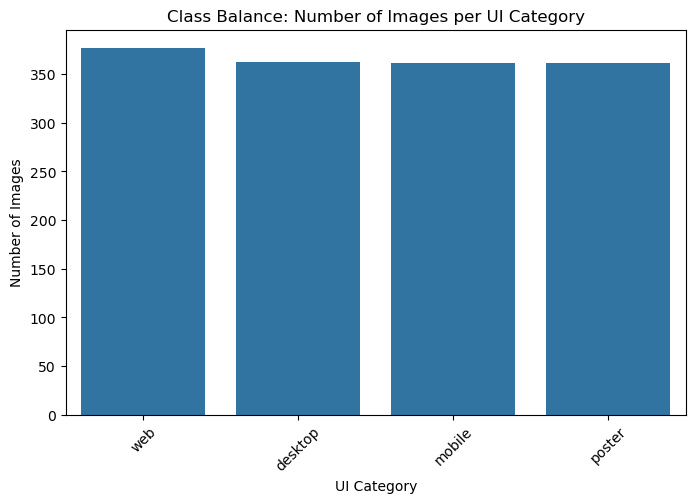

In [125]:
# ---------------------
# 1. Class Balance Plot
# ---------------------
plt.figure(figsize=(8, 5))
sns.countplot(data=df, x="Category", order=df["Category"].value_counts().index)
plt.xlabel("UI Category")
plt.ylabel("Number of Images")
plt.title("Class Balance: Number of Images per UI Category")
plt.xticks(rotation=45)
plt.show()

From the class balance, number of images per UI category chart, one can tell that our dataset roughly has an equal number of images per UI category. Because each category (desktop, mobile, poster, web) has a similar number of images, we can more fairly evaluate generalization across categories.

If some categories have far fewer images, the results we see later could be skewed. We would have to take into consideration the fact that poor performance on an underrepresented category might be due to data scarcity rather than a model limitation.

Since all categories have equal representation, performance gaps will more clearly indicate true generalization issues later on. Our plan is to train the model only on the desktop category and then evaluate how well it generalizes to the three other categories (mobile, poster, and web). This approach allows us to test whether the model has learned transferable UI features rather than category-specific patterns.

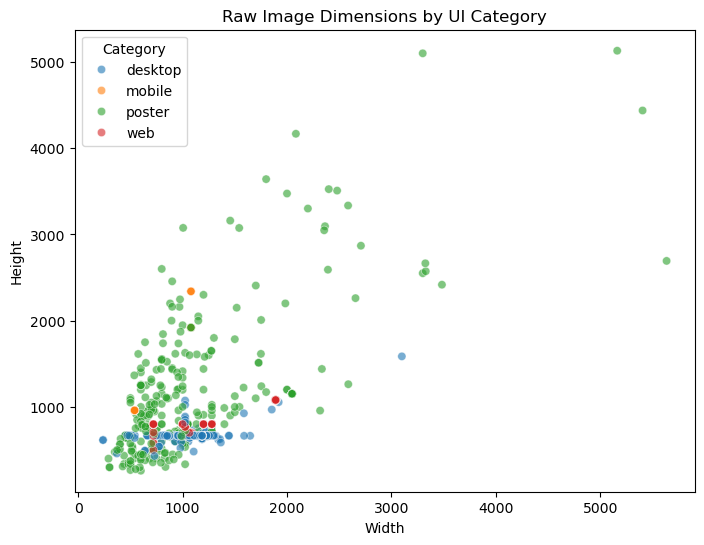

In [126]:
# -------------------------------
# 2. Raw Image Dimensions by Category
# -------------------------------
dims = []
for row in df.itertuples():
    image_path = os.path.join(IMAGE_FOLDER, row._1)
    try:
        with Image.open(image_path) as img:
            width, height = img.size
            dims.append((width, height, row.Category))
    except:
        continue

dim_df = pd.DataFrame(dims, columns=["Width", "Height", "Category"])
plt.figure(figsize=(8, 6))
sns.scatterplot(data=dim_df, x="Width", y="Height", hue="Category", alpha=0.6)
plt.title("Raw Image Dimensions by UI Category")
plt.show()

Onto the raw image dimensions by UI category, one can see that our dataset contains a wide range of image heights across categories, especially for images in the Poster Category, which dominate the upper range.

Deep learning models, especially CNNs, work best with fixed input sizes. Thus, later on you will see we standardized all our images to 224x224 pixels to ensure that the model processes images in a uniform way, reducing computational complexity.

As for why we picked 224 x 224 pixels, popular CNNS were originally designed and pretrained with this resolution, thus using 224 x 224 pixels ensures compatibility with the models. It is also worth noting that at 224 x 224 pixels, CNNs can still capture essential visual features such as:
edges, shapes, and textures in early layers; and higher-level patterns and object structures in deeper layers. This resolution is high enough for recognizing key UI elements but low enough to prevent unnecessary details from overwhelming the model.

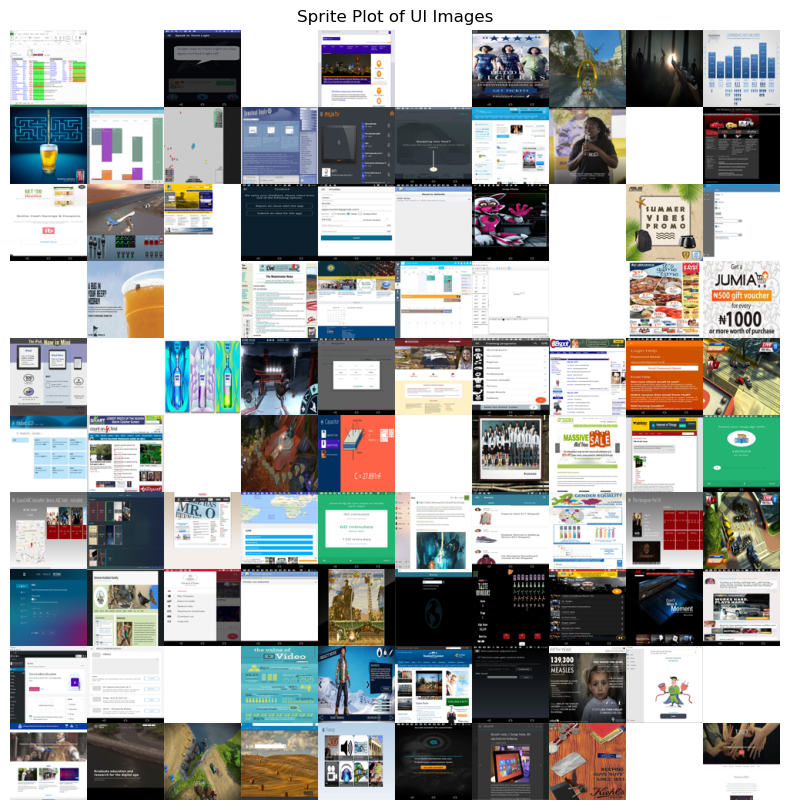

In [127]:
# -------------------------------
# 3. Sprite Plot (100 random samples)
# -------------------------------
sample_df = df.sample(min(100, len(df)), random_state=42)
grid_size = int(np.ceil(np.sqrt(len(sample_df))))
sprite_image = np.ones((grid_size * 100, grid_size * 100, 3))

for idx, row in enumerate(sample_df.itertuples()):
    row_idx, col_idx = divmod(idx, grid_size)
    path = os.path.join(IMAGE_FOLDER, row._1)
    try:
        with Image.open(path) as img:
            img = img.resize((100, 100))
            img_array = np.array(img) / 255.0
            if img_array.ndim == 2:
                img_array = np.stack([img_array]*3, axis=-1)
            sprite_image[row_idx*100:(row_idx+1)*100, col_idx*100:(col_idx+1)*100] = img_array
    except:
        continue

plt.figure(figsize=(10, 10))
plt.imshow(sprite_image)
plt.axis("off")
plt.title("Sprite Plot of UI Images")
plt.show()

Next, our sprite plot reveals distinct visual differences between mobile, desktop, web, and poster UIs.

We can see that desktop and desktop UIs appear visually structured, which makes sense as designers are following certain conventions and design principles as they go about designing these interfaces. In particular, they feature clear navigation bars, form inputs, buttons, and other UI elements that the model can detect.

On the other hand, we see from the sprite plot that web and poster UIs have more complex, text-heavy designs.

Since posters and web pages are often designed for readability rather than interactive UI elements, their layouts are less grid-like and more varied, making it harder for a model trained on structured UI data to generalize.

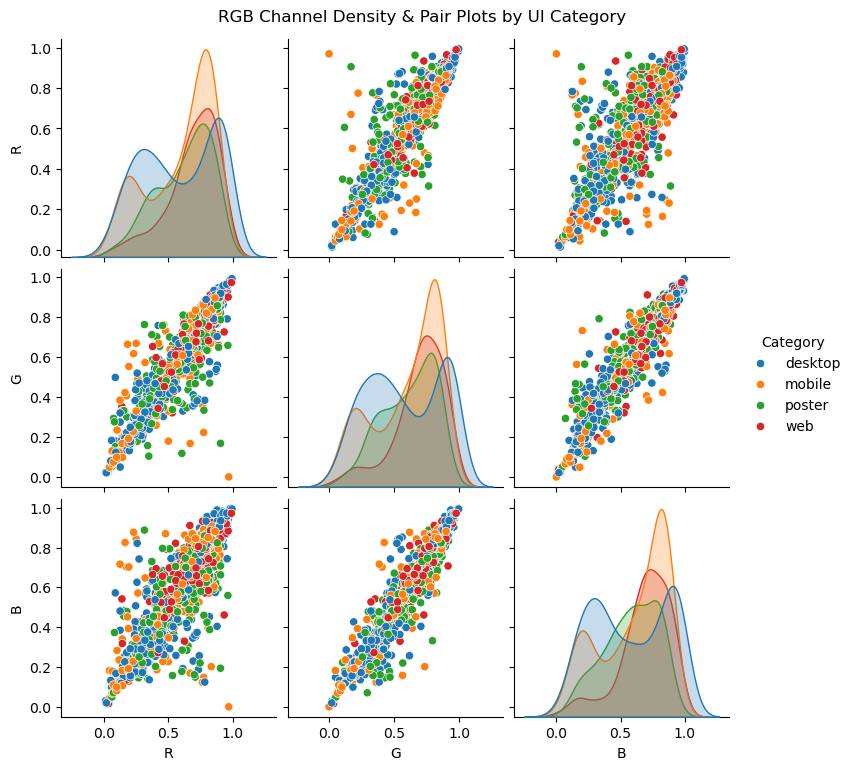

In [128]:
# -------------------------------
# 4. RGB Channel Distributions
# -------------------------------
rgb_stats = []
for row in df.itertuples():
    path = os.path.join(IMAGE_FOLDER, row._1)
    try:
        with Image.open(path) as img:
            img_array = np.array(img) / 255.0
            if img_array.shape[-1] == 3:
                r, g, b = img_array[..., 0].mean(), img_array[..., 1].mean(), img_array[..., 2].mean()
                rgb_stats.append((r, g, b, row.Category))
    except:
        continue

rgb_df = pd.DataFrame(rgb_stats, columns=["R", "G", "B", "Category"])
sns.pairplot(rgb_df, hue="Category", diag_kind="kde")
plt.suptitle("RGB Channel Density & Pair Plots by UI Category", y=1.02)
plt.show()

For our RGB Channel Density, the scatter plots illustrate the correlation between R, G, and B values across UI images.

We see that points cluster along diagonal trends, suggesting that UI images maintain a relatively consistent color balance rather than having extreme variations in individual channels.

Different UI categories (which we color-coded) overlap significantly, meaning no single category dominates a particular color space.

If one category had a distinct color distribution, the model might learn to classify UI types based on color alone.
However, since all UI types share similar RGB relationships, the model is likely focusing on structural and textual features instead of color to differentiate them.

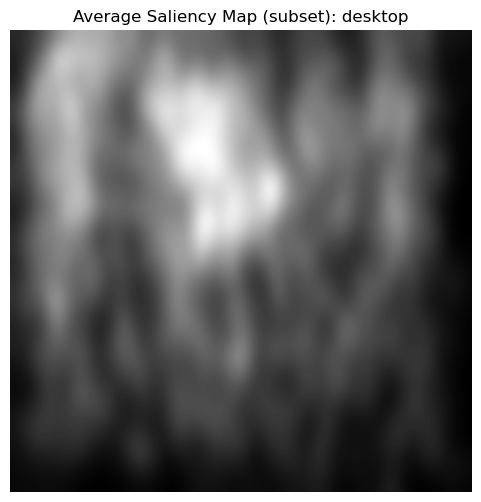

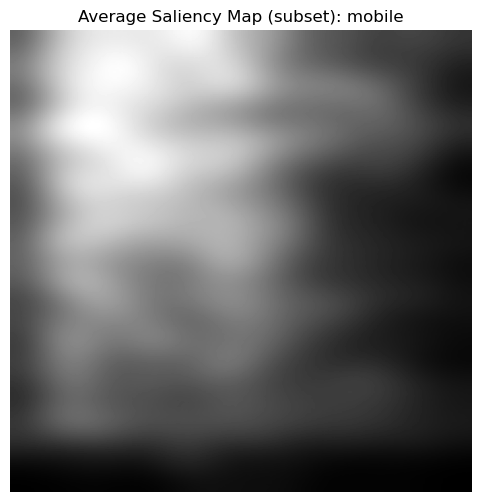

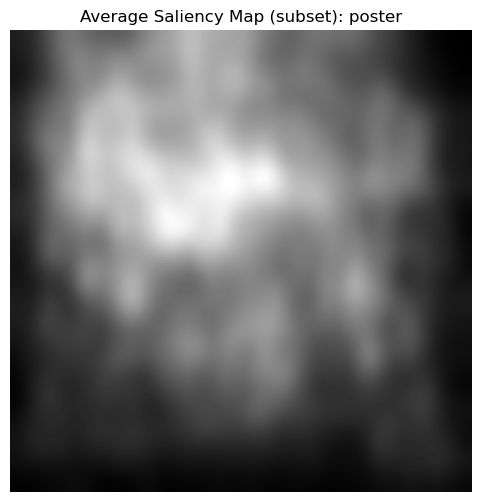

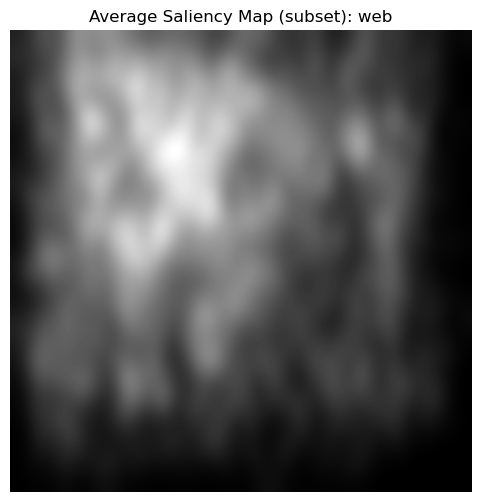

In [135]:
# -------------------------------
# 5. Average Saliency Map per Category (Subset + Resize Fix)
# -------------------------------
from collections import defaultdict

sal_map_groups = defaultdict(list)
max_per_category = 40
standard_size = (224, 224)  # Resize everything to this

# Sample a fixed number of images per category
for category in df["Category"].unique():
    subset = df[df["Category"] == category].sample(n=min(max_per_category, df[df["Category"] == category].shape[0]))
    for row in subset.itertuples():
        sal_path = os.path.join(SAL_MAP_FOLDER, row._1)
        try:
            with Image.open(sal_path) as sal_img:
                sal_img = sal_img.resize(standard_size)
                sal_array = np.array(sal_img) / 255.0
                if sal_array.ndim == 3:
                    sal_array = sal_array[..., 0]
                sal_map_groups[category].append(sal_array)
        except:
            continue

# Plot average saliency map
for category, maps in sal_map_groups.items():
    avg_sal = np.mean(np.stack(maps, axis=0), axis=0)
    plt.figure(figsize=(6, 6))
    plt.imshow(avg_sal, cmap="gray")
    plt.axis("off")
    plt.title(f"Average Saliency Map (subset): {category}")
    plt.show()

For Desktop UI, we see that the focused saliency in the central area, indicating the model is likely attending to primary UI elements (e.g., menus, buttons).

For Mobile UI, we see that there is more spread-out saliency with stronger attention to the top and left, suggesting the model recognizes mobile UIs as having hierarchical, stacked elements.

For Poster UI, we observe that saliency  is less structured and diffused, possibly because posters contain large imagery and less defined UI components, making them harder for the model to parse.

And finally for Web UI, saliency is more scattered, indicating difficulty in detecting clear focal points, likely due to denser text layouts and varied page structures.

The model seems to clearly recognizes structured UIs (desktop, mobile) more effectively than text-heavy or image-centric ones (poster, web). This aligns with what we see in our results in terms of better generalization to mobile and weaker performance on posters and web UIs.


For the boxplot of saliency values by category, the median saliency values are relatively low across all categories, suggesting the model’s focus is spread out rather than pinpointed. Notably, mobile UI has slightly higher saliency variance, which could indicate that mobile layouts, while structured, still vary enough to require flexible attention.

It is possible that the model may not be strongly fixating on specific UI components consistently, which could be a sign that fine-tuning is needed for more precise feature learning.

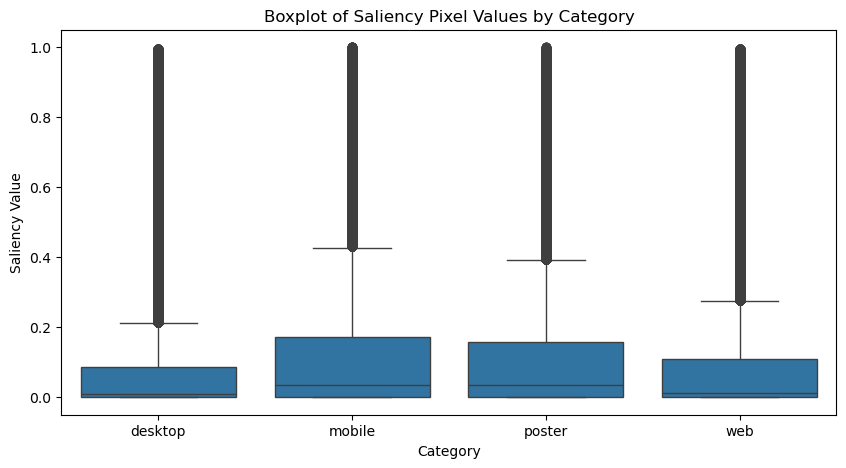

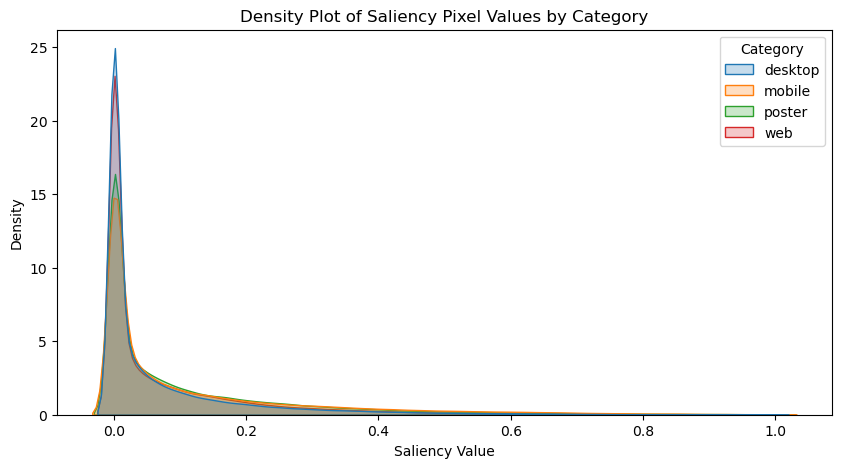

In [133]:
# -------------------------------
# 6. Saliency Pixel Value Distributions
# -------------------------------
sal_pixel_vals = []
for category, maps in sal_map_groups.items():
    for arr in maps:
        vals = arr.flatten()
        sal_pixel_vals.extend([(v, category) for v in vals])

sal_pixel_df = pd.DataFrame(sal_pixel_vals, columns=["Saliency Value", "Category"])

plt.figure(figsize=(10, 5))
sns.boxplot(data=sal_pixel_df, x="Category", y="Saliency Value")
plt.title("Boxplot of Saliency Pixel Values by Category")
plt.show()

plt.figure(figsize=(10, 5))
sns.kdeplot(data=sal_pixel_df, x="Saliency Value", hue="Category", common_norm=False, fill=True)
plt.title("Density Plot of Saliency Pixel Values by Category")
plt.show()

And finally, for the density plot of saliency pixel values,
all categories have a high density of low-saliency pixels. This observation aligns with our choice of CNN-based architecture, where convolutional layers are naturally designed to detect patterns in structured layouts (e.g., buttons, menus, hierarchical UI elements) rather than pixel-specific details.

Since the saliency map density is skewed towards low-saliency values, we need metrics that are well-suited for highly imbalanced distributions of saliency scores. This explains our choice of AUC-Judd because it does not penalize broad attention as long as it aligns with meaningful UI structures and AUC-PR.

Given the high imbalance in saliency pixel values (mostly low-saliency pixels), AUC-PR is a stronger metric than AUC-ROC, because it specifically focuses on how well the model detects the true high-saliency regions.

Since web and poster UIs tend to be text-heavy, AUC-PR allows us to better assess how well the model is picking up important UI elements rather than background or decorative regions.

This is especially relevant when comparing generalization performance across categories.

# Loss Functions & Evaluation Metrics

### Utility Methods

In [120]:
# ----------------------------- Results Display and Visualization -----------------------------

pd.set_option('display.float_format', '{:.15f}'.format)

def test_data_performance(model, data_gen):
    '''
    Display the model's performance on the provided data across different metrics.
    '''
    # Compute performance on train data
    performance = model.evaluate(data_gen,return_dict=True, verbose=0)
    
    # Provide results in a table    
    return pd.DataFrame(performance, index=[0])


def train_test_performance(model):
    '''
    Display the model's performance on training and test data (desktop UI) across different metrics.
    '''
    # Compute performance on train data
    performance_train = model.evaluate(train_data_gen,return_dict=True, verbose=0)
    performance_train = pd.DataFrame(performance_train,index=['Train'])
    '''
    performance_train = {}
    for metric in model.metrics:
        result = metric.result()
        result = result.numpy().item()
        if isinstance(result, dict):
            performance_train.update(result)
        else:
            performance_train[metric.name] = result
    performance_train = pd.DataFrame(performance_train,index=['Train'])
    '''
    
    # Compute performance on test data
    performance_test = model.evaluate(test_data_gen_desktop,return_dict=True, verbose=0)
    performance_test = pd.DataFrame(performance_test,index=['Test'])

    # Provide results in a table    
    return pd.concat([performance_train, performance_test])

from scipy.stats import ttest_rel  # For paired t-tests
def compare_train_test_performance(models):
    '''
    Plot train and test performance for a dictionary of models across different metrics.
    Bars are grouped by metrics and color-coded by model.
    '''
    # Initialize dataframes to store train and test performance for all models
    train_performance = pd.DataFrame()
    test_performance = pd.DataFrame()
    
    # Evaluate each model's performance
    for name, model in models.items():
        # Compute performance on train data
        performance_train = model.evaluate(train_data_gen,return_dict=True, verbose=0)
        performance_train = pd.DataFrame(performance_train,index=['Train'])
        performance_train["Model Name"] = name
        performance_train = performance_train.set_index('Model Name')
        
        # Compute performance on test data
        performance_test = model.evaluate(test_data_gen_desktop,return_dict=True, verbose=0)
        performance_test = pd.DataFrame(performance_test,index=['Test'])
        performance_test["Model Name"] = name
        performance_test = performance_test.set_index('Model Name')

        # Append to the overall train and test performance dataframes
        train_performance = pd.concat([train_performance, performance_train], axis=0)
        test_performance = pd.concat([test_performance, performance_test], axis=0)


    # Transpose the dataframes for plotting
    train_performance = train_performance.T
    test_performance = test_performance.T
    if 'information_gain' in train_performance.index:
        train_performance.drop(['information_gain'], inplace=True)
    if 'information_gain' in test_performance.index:
        test_performance.drop(['information_gain'], inplace=True)
    if 'loss' in train_performance.index:
        train_performance.drop(['loss'], inplace=True)
    if 'loss' in test_performance.index:
        test_performance.drop(['loss'], inplace=True)
    
    # Plotting
    num_metrics = len(test_performance.index)
    num_models = len(models)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(3*num_metrics, 10))
    
    # Helper function to plot grouped bar plots
    def plot_grouped_bars(ax, df, title):
        bar_width = 0.8 / num_models
        indices = np.arange(num_metrics)
        
        # Plot each model's performance as a group of bars
        for i, (name, _) in enumerate(models.items()):
            ax.bar(indices + i * bar_width, df[name], width=bar_width, label=name) # [f"{name}-{m}" for m in df.index.str.split('-').str[-1]]
        
        # Add the numerical values on top of the bars
        for i, (name, _) in enumerate(models.items()):
            for j, value in enumerate(df[name]):
                ax.text(j + i * bar_width, value + 0.02 * df.values.max(), f'{value:.3f}', 
                        ha='center', va='bottom', fontsize=10, rotation=65)
        
        '''
        # Perform statistical tests and add significance markers
        for j, metric in enumerate(df.index):
            model_names = list(models.keys())
            metric_values = [df.loc[metric, name] for name in model_names]
            
            # Compare all pairs of models using a paired t-test
            for k in range(len(model_names)):
                for l in range(k + 1, len(model_names)):
                    # Perform a paired t-test (assuming paired data is available)
                    # Replace this with your actual statistical test
                    _, p_value = ttest_rel([metric_values[k]], [metric_values[l]])
                    
                    # Add significance marker if p-value is below a threshold (e.g., 0.05)
                    if p_value < 0.05:
                        x_pos = j + (k + l) * bar_width / 2
                        y_pos = max(metric_values[k], metric_values[l]) + 0.1
                        ax.text(x_pos, y_pos, '*', ha='center', va='bottom', fontsize=12, color='red')
        '''

        # Set the axis labels and title
        ax.set_ylabel('Metric Scores')
        ax.set_ylim(0, 1)
        ax.set_title(title, pad=30)
        ax.set_xticks(indices + bar_width * (num_models - 1) / 2)
        ax.set_xticklabels(df.index)
        ax.legend(title='Models', bbox_to_anchor=(1, 1), loc='upper left')
        ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Plot train performance
    plot_grouped_bars(ax1, train_performance, 'Train Performance Across Models')
    
    # Plot test performance
    plot_grouped_bars(ax2, test_performance, 'Test Performance Across Models')
    
    # Adjust layout and display
    plt.subplots_adjust(hspace=0.4)
    plt.show()

    return train_performance.T, test_performance.T


def visualize_results(model, data_gen, num_samples=5):
    '''
    Function to visualize the original image, ground truth saliency map, and predicted saliency map.
    '''
    plt.figure(figsize=(15, 5 * num_samples))
    
    for i in range(num_samples):
        # Get a new batch for each sample
        X, Y_sal = data_gen[i % len(data_gen)]  # Cycle through batches if num_samples > batch_size
        
        # Predict saliency map
        Y_pred = model.predict(X, verbose=1)
        
        # Original Image (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(X[i])
        plt.title("Original Image")
        plt.axis('off')
        
        # Ground Truth Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(Y_sal[i].squeeze(), cmap='gray')
        plt.title("Ground Truth Saliency Map")
        plt.axis('off')
        
        # Predicted Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(Y_pred[i].squeeze(), cmap='gray')
        plt.title("Predicted Saliency Map")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()


def compare_2_models_visualized_results(model_old, model_new, data_gen, num_samples=5):
    '''
    Function to visualize the original image, ground truth saliency map, and predicted saliency maps of two different models.
    '''
    plt.figure(figsize=(15, 5 * num_samples))
    
    for i in range(num_samples):
        # Get a new batch for each sample
        X, Y_sal = data_gen[i % len(data_gen)]  # Cycle through batches if num_samples > batch_size
        
        # Predict saliency maps
        Y_pred_old = model_old.predict(X, verbose=0)
        Y_pred_new = model_new.predict(X, verbose=0)
        
        # Original Image (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 4, i * 4 + 1)
        plt.imshow(X[i])
        plt.title("Original Image")
        plt.axis('off')
        
        # Ground Truth Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 4, i * 4 + 2)
        plt.imshow(Y_sal[i].squeeze(), cmap='gray')
        plt.title("Ground Truth Saliency Map")
        plt.axis('off')
        
        # Predicted Saliency Map by Model 1 (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 4, i * 4 + 3)
        plt.imshow(Y_pred_old[i].squeeze(), cmap='gray')
        plt.title(f"Predicted Saliency Map by Old Model")
        plt.axis('off')

        # Predicted Saliency Map by Model 2 (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 4, i * 4 + 4)
        plt.imshow(Y_pred_new[i].squeeze(), cmap='gray')
        plt.title(f"Predicted Saliency Map by New Model")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()



def compare_visualized_results(models, data_gen):
    '''
    Function to visualize the original image, ground truth saliency map, and predicted saliency maps for a dictionary of models.
    The number of subplots per row is limited to 4.
    '''
    # Get the first sample from the first batch
    X, Y_sal = next(iter(data_gen))
    sample_image = X[0]
    sample_gt_saliency = Y_sal[0].squeeze()
    
    # Predict saliency maps for each model
    predicted_saliencies = {name: model.predict(X, verbose=0)[0].squeeze() for name, model in models.items()}
    
    # Determine the number of subplots
    num_models = len(models)
    total_subplots = 2 + num_models  # Original image + GT saliency + predictions
    num_rows = (total_subplots + 3) // 4  # Ensure no more than 4 subplots per row
    num_cols = min(total_subplots, 4)
    
    # Create the figure
    plt.figure(figsize=(5 * num_cols, 5 * num_rows))
    
    # Plot the original image
    plt.subplot(num_rows, num_cols, 1)
    plt.imshow(sample_image)
    plt.title("Original Image")
    plt.axis('off')
    
    # Plot the ground truth saliency map
    plt.subplot(num_rows, num_cols, 2)
    plt.imshow(sample_gt_saliency, cmap='gray')
    plt.title("Ground Truth Saliency Map")
    plt.axis('off')
    
    # Plot each model's predicted saliency map
    for i, (name, pred_saliency) in enumerate(predicted_saliencies.items()):
        plt.subplot(num_rows, num_cols, 3 + i)
        plt.imshow(pred_saliency, cmap='gray')
        plt.title(f"Predicted by {name}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()



def plot_learning_curve(history):
    '''
    Plot the learning curve according to loss function.
    '''
    # Extract loss and metrics from the history/dataframe object
    if isinstance(history, pd.DataFrame):
        loss = history['loss']
        val_loss = history['val_loss']
    else: 
        loss = history.history['loss']
        val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)
    
    # Plot the loss curve
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
        
    plt.tight_layout()
    plt.show()


def plot_learning_curves(history_dict):
    '''
    Plot the learning curves for multiple models' history objects.
    history_dict (dict): A dictionary where keys are model names and values are history objects.
    '''
    num_models = len(history_dict)
    
    # Determine the number of rows and columns for subplots
    max_subplots_per_row = 4
    num_rows = (num_models + max_subplots_per_row - 1) // max_subplots_per_row
    num_cols = min(num_models, max_subplots_per_row)

    # Create a figure with subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

    # Flatten the axes array if there are multiple rows
    if num_rows > 1:
        axes = axes.flatten()
    
    # If only one model, axes will not be a list, so convert it to a list
    if num_models == 1:
        axes = [axes]

    # Plot the learning curve for each model
    for i, (model_name, history) in enumerate(history_dict.items()):
        # Extract loss and metrics from the history object
        if isinstance(history, pd.DataFrame):
            loss = history['loss']
            val_loss = history['val_loss']
        else: 
            loss = history.history['loss']
            val_loss = history.history['val_loss']
        epochs = range(1, len(loss) + 1)
        
        # Plot the loss curve
        ax = axes[i]
        ax.plot(epochs, loss, 'bo-', label='Training Loss')
        ax.plot(epochs, val_loss, 'ro-', label='Validation Loss')
        ax.set_title(f'{model_name} Loss')
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Loss')
        ax.legend()
    
    # Hide any unused subplots
    for j in range(i + 1, num_rows * num_cols):
        axes[j].axis('off')
    
    plt.suptitle('Learning curves based on loss during training')
    plt.tight_layout()
    plt.show()

#------------------------------------------------- following functions are getting errors

'''
def plot_all_learning_curves(history_obj):

    # Create a 2x4 grid of subplots
    fig, axes = plt.subplots(2, 4, figsize=(5*2, 5*4))
    fig.suptitle('Training and Validation Performance', fontsize=16)

    # Flatten the axes array for easy iteration
    axes = axes.flatten()

    # Plot each metric in a subplot
    train_metric = history_obj.history['auc_judd']
    val_metric = history_obj.history['val_auc_judd']
    epochs = range(1, len(train_metric) + 1) # number of epochs
    axes[0].plot(epochs, train_metric, 'bo-', label='Training')
    axes[0].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('AUC-Judd')
    axes[0].legend()
    
    train_metric = history_obj.history['auc_PR']
    val_metric = history_obj.history['val_auc_PR']
    axes[1].plot(epochs, train_metric, 'bo-', label='Training')
    axes[1].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('AUC-PR')
    axes[1].legend()

    train_metric = history_obj.history['nss']
    val_metric = history_obj.history['val_nss']
    axes[2].plot(epochs, train_metric, 'bo-', label='Training')
    axes[2].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[2].set_xlabel('Epochs')
    axes[2].set_ylabel('NSS')
    axes[2].legend()

    train_metric = history_obj.history['information_gain']
    val_metric = history_obj.history['val_information_gain']
    axes[3].plot(epochs, train_metric, 'bo-', label='Training')
    axes[3].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[3].set_xlabel('Epochs')
    axes[3].set_ylabel('Information Gain')
    axes[3].legend()

    train_metric = history_obj.history['similarity']
    val_metric = history_obj.history['val_similarity']
    axes[4].plot(epochs, train_metric, 'bo-', label='Training')
    axes[4].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[4].set_xlabel('Epochs')
    axes[4].set_ylabel('Similarity')
    axes[4].legend()

    train_metric = history_obj.history['similarity_opposite']
    val_metric = history_obj.history['val_similarity_opposite']
    axes[5].plot(epochs, train_metric, 'bo-', label='Training')
    axes[5].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[5].set_xlabel('Epochs')
    axes[5].set_ylabel('Similarity (Opposite)')
    axes[5].legend()

    train_metric = history_obj.history['correlation_coefficient']
    val_metric = history_obj.history['val_correlation_coefficient']
    axes[6].plot(epochs, train_metric, 'bo-', label='Training')
    axes[6].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[6].set_xlabel('Epochs')
    axes[6].set_ylabel('Correlation Coefficient')
    axes[6].legend()

    train_metric = history_obj.history['kl_divergence']
    val_metric = history_obj.history['val_kl_divergence']
    axes[7].plot(epochs, train_metric, 'bo-', label='Training')
    axes[7].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[7].set_xlabel('Epochs')
    axes[7].set_ylabel('KL Divergence')
    axes[7].legend()

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()


def plot_all_learning_curves_not_working(history_obj):
    #TODO: 'History' object is not scriptable error
    # Define the metrics to plot
    metrics_to_plot = ['auc_judd', 'auc_PR', 'nss', 'information_gain', 'similarity', 'similarity_opposite', 'correlation_coefficient', 'kl_divergence']

    # Create a 2x4 grid of subplots (adjust rows and columns as needed)
    num_metrics = int(len(metrics_to_plot)/2)
    num_rows = 2
    num_cols = (num_metrics + 1) // 2  # Ensure enough columns
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))
    fig.suptitle('Training and Validation Performance', fontsize=16)

    # Flatten the axes array for easy iteration
    axes = axes.flatten()

    # Plot each metric in a subplot
    for i, metric in enumerate(metrics_to_plot):
        
        # Extract loss and metrics from the history object
        train_metric = history_obj.history[f'{metric}']
        val_metric = history_obj.history[f'val_{metric}']
        epochs = range(1, len(train_metric) + 1)

        ax = axes[i]
        ax.plot(epochs, train_metric, 'bo-', label=f'Training {metric}')
        ax.plot(epochs, val_metric, 'ro-', label=f'Validation {metric}')
        ax.set_title(metric.upper())
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric)
        ax.legend()

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()
'''

"\ndef plot_all_learning_curves(history_obj):\n\n    # Create a 2x4 grid of subplots\n    fig, axes = plt.subplots(2, 4, figsize=(5*2, 5*4))\n    fig.suptitle('Training and Validation Performance', fontsize=16)\n\n    # Flatten the axes array for easy iteration\n    axes = axes.flatten()\n\n    # Plot each metric in a subplot\n    train_metric = history_obj.history['auc_judd']\n    val_metric = history_obj.history['val_auc_judd']\n    epochs = range(1, len(train_metric) + 1) # number of epochs\n    axes[0].plot(epochs, train_metric, 'bo-', label='Training')\n    axes[0].plot(epochs, val_metric, 'ro-', label='Validation')\n    axes[0].set_xlabel('Epochs')\n    axes[0].set_ylabel('AUC-Judd')\n    axes[0].legend()\n    \n    train_metric = history_obj.history['auc_PR']\n    val_metric = history_obj.history['val_auc_PR']\n    axes[1].plot(epochs, train_metric, 'bo-', label='Training')\n    axes[1].plot(epochs, val_metric, 'ro-', label='Validation')\n    axes[1].set_xlabel('Epochs')\n    ax

In [9]:
# ----------------------------- Scaling Functions ----------------------------- 

def batch_min_max_scaling(heatmap):
    '''
    Min-Max scaling
    This method is from 'sal_imp_utilities.py' written by the UEyes team, called 'normalize'.
    '''

    # Apply mimaxscaler algorithm (https://en.wikipedia.org/wiki/Feature_scaling#Rescaling_(min-max_normalization))
    heatmap = (heatmap - K.min(heatmap)) / (K.epsilon() + K.max(heatmap) - K.min(heatmap))
    
    return heatmap

def min_max_scaling(heatmap):
    '''
    Min-Max scaling
    '''
    # Compute min and max for each sample in the batch
    min_vals = K.min(heatmap, axis=[1, 2], keepdims=True)  # Shape: (batch_size, 1, 1, 1)
    max_vals = K.max(heatmap, axis=[1, 2], keepdims=True)  # Shape: (batch_size, 1, 1, 1)

    # Apply min-max scaling to each sample
    heatmap = (heatmap - min_vals) / (K.epsilon() + max_vals - min_vals)

    return heatmap

def max_scaling(heatmap):
    '''
    Max scaling
    This method is adapted from 'sal_imp_utilities.py' written by the UEyes team.
    '''

    max_heatmap = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(heatmap, axis=[1,2]), axis=2),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    heatmap /= (max_heatmap + K.epsilon())
    
    return heatmap

In [10]:
# ----------------------------- Normalization Functions ----------------------------- 

def batch_sum_normalize(heatmap):
    '''
    Sum Normalize heatmap values in the [0,1] range across the tensor (batch).
    '''
    heatmap /= (K.epsilon() + K.sum(heatmap))

    return heatmap

def sum_normalize(heatmap):
    '''
    Sum Normalize heatmap values in the [0,1] range across each map in the tensor (batch).
    '''
    
    heatmap /= (K.epsilon() + tf.reduce_sum(heatmap, axis=[1, 2], keepdims=True))

    return heatmap

### UEyes Team's Implementations

As the objective of this project involves reevaluting the UEyes team's loss terms, we wanted to walk through their implementations to gain a better understanding of how each loss/metric was calculated. Note that we were only able to recover the implementations for NSS, CC, SIM,and KLD. We were unable to find their implementations for AUC-Judd and IG, thus, have to implement them based on our understanding of how these metrics are used for the saliency map prediction task as outlined by UEyes. 

In [11]:
# ------------------------------------ Evaluation Metrics (implementation provided by UEyes, some inform loss functions) ------------------------------------

def nss_(y_true, y_pred, scaler=False):
    """
    Compute Normalized Scanpath Saliency (NSS) score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    """
    ax = 1

    if K.all(K.equal(K.sum(K.sum(y_true, axis=ax), axis=ax), 0.0)):
        return 0.0

    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=ax), axis=ax), axis=ax+1), IMG_SIZE[0], axis=ax), axis=ax+1), IMG_SIZE[1], axis=ax+1)

    y_pred /= (max_y_pred + K.epsilon())

    y_pred_flatten = K.batch_flatten(y_pred)

    y_mean = K.mean(y_pred_flatten, axis=-1)
    y_mean = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.expand_dims(y_mean)), IMG_SIZE[0], axis=ax)), IMG_SIZE[1], axis=ax+1)

    y_std = K.std(y_pred_flatten, axis=-1)
    y_std = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.expand_dims(y_std)), IMG_SIZE[0], axis=ax)), IMG_SIZE[1], axis=ax+1)

    y_pred = (y_pred - y_mean) / (y_std + K.epsilon())

    den = K.sum(K.sum(y_true * y_pred, axis=ax), axis=ax)
    nom = K.sum(K.sum(y_true, axis=ax), axis=ax) + K.epsilon()

    nss_out = den/nom
    if scaler:
        nss_out = K.mean(nss_out)

    return  nss_out

def correlation_coefficient_(y_true, y_pred, scaler=False):
    """
    Compute Cross-Correlation (CC) score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    """
    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_pred /= (max_y_pred + K.epsilon())
    
    sum_y_true = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_true, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    sum_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_true /= (sum_y_true + K.epsilon())
    y_pred /= (sum_y_pred + K.epsilon())

    N = IMG_SIZE[0] * IMG_SIZE[1]
    sum_prod = K.sum(K.sum(y_true * y_pred, axis=1), axis=1)
    sum_x = K.sum(K.sum(y_true, axis=1), axis=1)
    sum_y = K.sum(K.sum(y_pred, axis=1), axis=1)
    sum_x_square = K.sum(K.sum(K.square(y_true), axis=1), axis=1)
    sum_y_square = K.sum(K.sum(K.square(y_pred), axis=1), axis=1)

    num = sum_prod - ((sum_x * sum_y) / N)
    den = K.sqrt((sum_x_square - K.square(sum_x) / N) * (sum_y_square - K.square(sum_y) / N)) + K.epsilon()

    if scaler: 
        return K.mean(num / den)
    else:
        return num / den

def batch_min_max_sum_normalize(heatmap):
    '''
    Min-Max scaling
    Sum Normalize heatmap values in the [0,1] range across entire tensor (batch).
    This method is from 'sal_imp_utilities.py' written by the UEyes team, called 'normalize'.
    '''

    # Apply mimaxscaler algorithm (https://en.wikipedia.org/wiki/Feature_scaling#Rescaling_(min-max_normalization))
    heatmap = (heatmap - K.min(heatmap)) / (K.epsilon() + K.max(heatmap) - K.min(heatmap))

    # Sum normalization
    heatmap /= (K.epsilon() + K.sum(heatmap))
    
    return heatmap

def similarity_(y_true, y_pred):
    '''
    Compute Similarity score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    '''
    y_pred = batch_min_max_sum_normalize(y_pred)
    y_true = batch_min_max_sum_normalize(y_true)

    return K.sum(K.minimum(y_pred, y_true))

kl = tf.keras.losses.KLDivergence() # Initialize the KL Divergence loss instance once
def kl_divergence_(y_true, y_pred):
    '''
    Compute Kullback-Leibler divergence loss.
    This method is from 'losses_keras2.py' written by the UEyes team.
    '''

    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_pred /= max_y_pred

    sum_y_true = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_true, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    sum_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_true /= (sum_y_true + K.epsilon())
    y_pred /= (sum_y_pred + K.epsilon())
    
    return kl(y_true,y_pred)


# ------------------------------------ Loss Functions (implementation provided by UEyes, those redundant with evaluation metrics not shown) ------------------------------------

mse = tf.keras.losses.MeanSquaredError()

def combined_loss_UEyes_(y_true, y_pred):
    '''
    Uses functions implemented by UEyes.

    Loss function that combines cc, nss and kl. Beacuse nss receives a different ground truth than kl and cc (maps),
        the function requires y_true to contains both maps. It has to be a tensor with dimensions [bs, 2, r, c, 1]. y_pred also
        has to be a tensor of the same dim, so the model should add a 5th dimension between bs and r and repeat the predict map
        twice along that dim.
    This method is adapted from the method in 'losses_keras2.py' written by the UEyes team.
    Returns a combined loss term with the specified weights that can be used in model.compile().
    '''

    # loss term weights specified by the UEyes team
    kl_weight=10.0
    cc_weight=3.0
    sim_weight=1.0
    nss_weight=0.5
    mse_weight=1

    # compute loss terms
    k = kl_divergence_(y_true, y_pred)
    c = correlation_coefficient_(y_true, y_pred)
    n = nss_(y_true, y_pred)
    s = similarity_(y_true, y_pred)
    m = mse(y_true, y_pred) # tf.reduce_mean(tf.square(y_true - y_pred))
    
    # combined loss
    return kl_weight*k - nss_weight*n - sim_weight*s - cc_weight*c  + mse_weight*m 

Evaluate the behavior of the losses and metrics with extreme cases.

In [12]:
pd.reset_option('display.precision')
def metrics_behavior(metrics):
    '''
    Display how the given metrics/losses evaluate 4 extreme cases of pairwise comparison between batches of data with the specified batch size.
    '''

    # Create fully salient tensor (all 1's)
    all_salient = tf.ones((1, IMG_SIZE[0], IMG_SIZE[1], 1), dtype=tf.float32)

    # Create fully non-salient tensor (all 0's)
    not_salient = tf.zeros((1, IMG_SIZE[0], IMG_SIZE[1], 1), dtype=tf.float32)

    # Define the cases
    cases = {
        "True Positive": (all_salient, all_salient),
        "True Negative": (not_salient, not_salient),
        "False Positive": (not_salient, all_salient),
        "False Negative": (all_salient, not_salient)
    }

    # Create a table to store results
    behavior = {case: {} for case in cases}

    # Evaluate scores for each case and method
    for case, (y_true, y_pred) in cases.items():
        for method_name, method in metrics.items():
            score = method(y_true, y_pred)
            if method_name=="Correlation Coefficient" or method_name=="Normalized Scanpath Saliency":
                score = method(y_true, y_pred, scaler=True)
            if not tf.is_tensor(score):
                score = tf.convert_to_tensor(score)
            behavior[case][method_name] = score.numpy()

    return pd.DataFrame(behavior)

def plot_grouped_barplot(metrics):
    """
    Plots a grouped bar plot given a pandas DataFrame.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the data to plot.
                       Columns represent different cases, and rows represent different metrics.
    """
    df = metrics_behavior(metrics)

    # Extract single-dimensional entries from the shape of an array
    df = df.applymap(np.squeeze)

    # Number of metrics and cases
    num_metrics = df.shape[0]
    num_cases = df.shape[1]

    # Set up the figure and axis
    bar_width = 0.8/num_metrics
    fig, ax = plt.subplots(figsize=(6*num_cases*num_metrics*bar_width, 5))

    # Set the positions for the bars
    indices = np.arange(num_cases)

    # Plot each case as a group of bars
    for i, metric in enumerate(df.index):
        ax.bar(indices + i * bar_width, df.loc[metric], width=bar_width, label=metric)

    # Add the numerical values on top of the bars
    for i, metric in enumerate(df.index):
        for j, value in enumerate(df.loc[metric]):
            ax.text(j + i * bar_width, value + 0.02 * df.values.max(), f'{value:.3f}', 
                    ha='center', va='bottom', fontsize=10, rotation=65)

    # Set the axis labels and title
    ax.set_ylabel('Metric Scores')
    ax.set_title('Grouped Bar Plot of Metric Scores by Case')
    ax.set_xticks(indices + bar_width * (num_metrics - 1) / 2)
    ax.set_xticklabels(df.columns)
    ax.set_ylim(-1, 1)
    ax.axhline(0, color='black', linewidth=0.8, linestyle='--')


    # Add a legend
    ax.legend(title='Metrics', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Show the plot
    plt.subplots_adjust(left=0.1, right=.9, top=0.9, bottom=0.1)
    plt.show()


### Motivation for updating the implementations

Metal device set to: Apple M1

systemMemory: 8.00 GB
maxCacheSize: 2.67 GB



2025-03-21 02:14:28.833544: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-03-21 02:14:28.839380: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


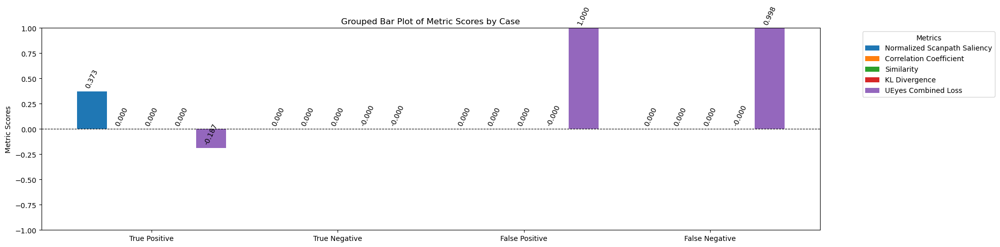

In [13]:
# Define the metrics and losses implemented by the UEyes team.
UEyes_methods = {
    "Normalized Scanpath Saliency": nss_,
    "Correlation Coefficient": correlation_coefficient_,
    "Similarity": similarity_, 
    "KL Divergence": kl_divergence_,
    'UEyes Combined Loss': combined_loss_UEyes_
}
plot_grouped_barplot(UEyes_methods)

**Similarity Score (SIM):**
- Should reward (be close to 1) true positives
- Penalize the rest

**KL Divergence (KLD):**
- Should penalize both false cases, the false negatives more than the false positives

**UEyes Combined Loss:**
- It's penalizing false positives and negativs equally, which is good, but not rewarding true positives and negatives equally.


*NSS and CC only takes into account the shapes of/covariance between the two maps, regardless of their similarity in terms of raw pixel values. Thus, it are insensitive to false positive/negatives solely in terms of magnitude so the test isn't very informative. We need to evaluate them on maps that have variance in terms of pixel values.*

**Normalized Scanpath Saliency (NSS):**

- NSS can be interpretted as measuring the tradeoff between the spread (i.e. variance, standard deviation) of the predicted saliency map and it's allignment with the ground truth. If the ground truth has a strong peak with a moderate spread, we expect the score to be the highest when the predicted map's spread matches it, followed by lower spread and higher spread (holding the allignment of their peaks fixed).
- NSS should reward true positives (TP) the most because they have the most allignment between predicted saliency with ground truth fixation points (highest saliency). It should penalize false negatives (FN) for low saliency at fixation points and be less sensitive to false positives (FP) and true negatives (TN) as they don't really contribute to the score at fixation points. However, the current implementation is unexpectedly rewarding TN much more than TP (identical to ground truth).

(-0.5, 223.5, 223.5, -0.5)

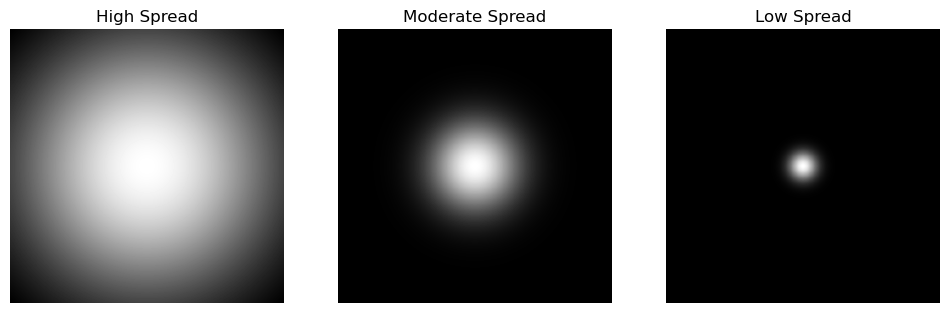

In [14]:
# Create center bias maps (Gaussian centered at the image center) with varying spreads
x = tf.linspace(-1.0, 1.0, 224)
y = tf.linspace(-1.0, 1.0, 224)
x, y = tf.meshgrid(x, y)

gaussian_high_spread = tf.exp(-(x**2 + y**2) / 1)  # Gaussian kernel
gaussian_high_spread = gaussian_high_spread / (K.sum(gaussian_high_spread) + K.epsilon())  # Normalize
gaussian_high_spread = tf.expand_dims(gaussian_high_spread, axis=-1)  # Add channel dimension
gaussian_high_spread = tf.expand_dims(gaussian_high_spread, axis=0)  # Add batch dimension
gaussian_high_spread = (gaussian_high_spread-K.min(gaussian_high_spread))/(K.max(gaussian_high_spread)-K.min(gaussian_high_spread)) # scale to [0,1]

gaussian_moderate_spread = tf.exp(-(x**2 + y**2) / 0.1)  # Gaussian kernel
gaussian_moderate_spread = gaussian_moderate_spread / (K.sum(gaussian_moderate_spread) + K.epsilon())  # Normalize
gaussian_moderate_spread = tf.expand_dims(gaussian_moderate_spread, axis=-1)  # Add channel dimension
gaussian_moderate_spread = tf.expand_dims(gaussian_moderate_spread, axis=0)  # Add batch dimension
gaussian_moderate_spread = (gaussian_moderate_spread-K.min(gaussian_moderate_spread))/(K.max(gaussian_moderate_spread)-K.min(gaussian_moderate_spread)) # scale to [0,1]

gaussian_low_spread = tf.exp(-(x**2 + y**2) / 0.01)  # Gaussian kernel
gaussian_low_spread = gaussian_low_spread / (K.sum(gaussian_low_spread) + K.epsilon())  # Normalize
gaussian_low_spread = tf.expand_dims(gaussian_low_spread, axis=-1)  # Add channel dimension
gaussian_low_spread = tf.expand_dims(gaussian_low_spread, axis=0)  # Add batch dimension
gaussian_low_spread = (gaussian_low_spread-K.min(gaussian_low_spread))/(K.max(gaussian_low_spread)-K.min(gaussian_low_spread)) # scale to [0,1]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,4)) 
ax1.imshow(gaussian_high_spread[0,:,:,:], cmap='gray')
ax1.set_title('High Spread')
ax1.axis('off')
ax2.imshow(gaussian_moderate_spread[0,:,:,:], cmap='gray')
ax2.set_title('Moderate Spread')
ax2.axis('off')
ax3.imshow(gaussian_low_spread[0,:,:,:], cmap='gray')
ax3.set_title('Low Spread')
ax3.axis('off')

In [15]:
print('Identical:', nss_(gaussian_moderate_spread, gaussian_moderate_spread).numpy()) # high
print('Higher Spread:', nss_(gaussian_moderate_spread, gaussian_high_spread).numpy()) # moderately low
print('Lower Spread:', nss_(gaussian_moderate_spread, gaussian_low_spread).numpy()) # low

Identical: [[2.3288617]]
Higher Spread: [[1.6316367]]
Lower Spread: [[1.3429456]]


(-0.5, 223.5, 223.5, -0.5)

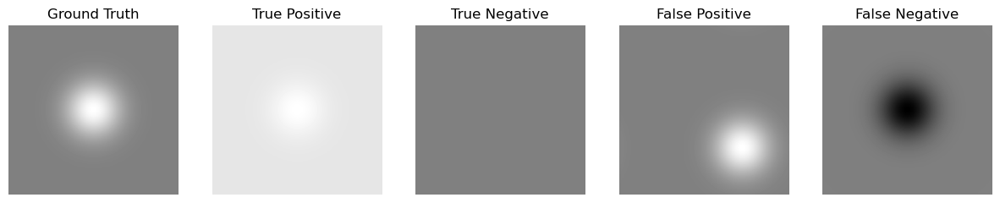

In [16]:
gaussian_gt = 0.5*gaussian_moderate_spread +0.5 # scale to [0.5, 1]

gaussian_tp = 0.1*gaussian_moderate_spread +0.9  # True Positive (aligned with ground truth but [0.9, 1])
gaussian_tn = 0.5*tf.ones((1, IMG_SIZE[0], IMG_SIZE[1], 1), dtype=tf.float32)  # True Negative (all 0.5's)
gaussian_fp = tf.roll(gaussian_gt, shift=(50, 50), axis=(1, 2))  # False Positive (misaligned)
gaussian_fn = (-gaussian_gt+1) # False Negative (inverted, predicts non-saliency areas correctly but predict salient areas as extra non-salient)

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(15,4)) 
ax1.imshow(gaussian_gt[0,:,:,:], cmap='gray', vmin=0, vmax=1)
ax1.set_title('Ground Truth')
ax1.axis('off')
ax2.imshow(gaussian_tp[0,:,:,:], cmap='gray', vmin=0, vmax=1)
ax2.set_title('True Positive')
ax2.axis('off')
ax3.imshow(gaussian_tn[0,:,:,:], cmap='gray', vmin=0, vmax=1)
ax3.set_title('True Negative')
ax3.axis('off')
ax4.imshow(gaussian_fp[0,:,:,:], cmap='gray', vmin=0, vmax=1)
ax4.set_title('False Positive')
ax4.axis('off')
ax5.imshow(gaussian_fn[0,:,:,:], cmap='gray', vmin=0, vmax=1)
ax5.set_title('False Negative')
ax5.axis('off')

In [17]:
print('True Positive:', nss_(gaussian_gt, gaussian_tp).numpy()) # high 
print('True Negative:', nss_(gaussian_gt, gaussian_tn).numpy()) # indifferent/low
print('False Positive:', nss_(gaussian_gt, gaussian_fp).numpy()) # indifferent/low
print('False Negative:', nss_(gaussian_gt, gaussian_fn).numpy()) # low

True Positive: [[0.16824618]]
True Negative: [[0.54381496]]
False Positive: [[-0.00434514]]
False Negative: [[-0.16824758]]


**Correlation Coefficient (CC):**
- Currently all zeros since the fully positive (salient) and fully negative (non-salient) maps are flat, i.e. the pixels have a constant value across both maps, so they both have zero variance, resulting in zero covariance, and thus, correlation. Need to test the CC with maps with varying pixel values.
- Should be indifferent to the magnitudes of the values and only capture how well two maps co-vary. The coefficient should be 1 between two maps of the same shape (even if one has larger values than the other) and -1 for a pair of inverted maps (negative correlation), however, we can see that the UEyes implementation isn't giving these cases a solid -1 or +1 score.

(-0.5, 223.5, 223.5, -0.5)

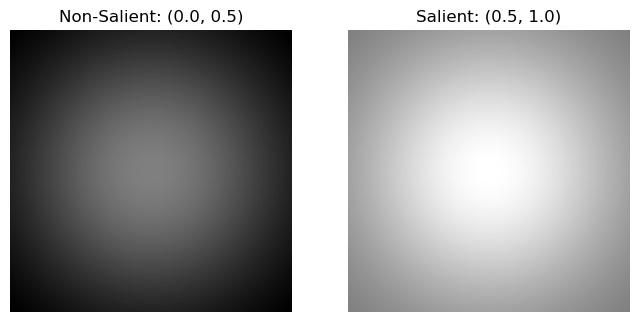

In [18]:
nonsalient_gaussian = 0.5*gaussian_high_spread # scale to [0,0.5]
salient_gaussian = nonsalient_gaussian+0.5 # scale to [0.5, 1]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4)) 
ax1.imshow(nonsalient_gaussian[0,:,:,:], cmap='gray', vmin=0, vmax=1)
ax1.set_title(f'Non-Salient: {K.min(nonsalient_gaussian).numpy(), K.max(nonsalient_gaussian).numpy()}')
ax1.axis('off')
ax2.imshow(salient_gaussian[0,:,:,:], cmap='gray', vmin=0, vmax=1)
ax2.set_title(f'Salient: {K.min(salient_gaussian).numpy(), K.max(salient_gaussian).numpy()}')
ax2.axis('off')

In [19]:
# should all be +1
print('True Positive:', correlation_coefficient_(salient_gaussian, salient_gaussian).numpy())
print('True Negative:', correlation_coefficient_(nonsalient_gaussian, nonsalient_gaussian).numpy())
print('False Positive:', correlation_coefficient_(nonsalient_gaussian, salient_gaussian).numpy())
print('False Negative:', correlation_coefficient_(salient_gaussian, nonsalient_gaussian).numpy())

True Positive: [[0.8503422]]
True Negative: [[0.98154193]]
False Positive: [[0.94560057]]
False Negative: [[0.945601]]


(-0.5, 223.5, 223.5, -0.5)

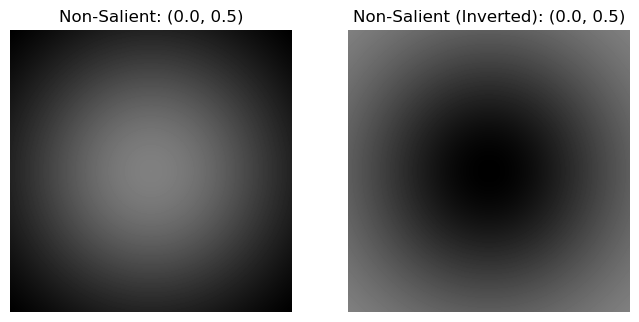

In [20]:
nonsalient_gaussian_invert = -nonsalient_gaussian+0.5

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4)) 
ax1.imshow(nonsalient_gaussian[0,:,:,:], cmap='gray', vmin=0, vmax=1)
ax1.set_title(f'Non-Salient: {K.min(nonsalient_gaussian).numpy(), K.max(nonsalient_gaussian).numpy()}')
ax1.axis('off')
ax2.imshow(nonsalient_gaussian_invert[0,:,:,:], cmap='gray', vmin=0, vmax=1)
ax2.set_title(f'Non-Salient (Inverted): {K.min(nonsalient_gaussian_invert).numpy(), K.max(nonsalient_gaussian_invert).numpy()}')
ax2.axis('off')

In [21]:
# should all be -1
print('Opposite Distributions:', correlation_coefficient_(nonsalient_gaussian, nonsalient_gaussian_invert).numpy())

Opposite Distributions: [[-0.9804704]]


### Updating the Implementations


...with added losses and metrics to consider.

In [22]:
# ------------------------------------ Evaluation Metrics ------------------------------------

# -------- Updated from UEyes' implementation:

def nss(y_true, y_pred, scaler=False):
    """
    Compute Normalized Scanpath Saliency (NSS) score and bound it to range [-1,+1] using tanh.
    """
    # Min-max scale both maps to [0,1]
    y_pred = batch_min_max_scaling(y_pred)
    y_true = batch_min_max_scaling(y_true)

    # Z-Normalize y_pred to zero (mean and unit variance)
    y_pred = (y_pred - tf.reduce_mean(y_pred, axis=[1,2], keepdims=True)) / (tf.math.reduce_std(y_pred, axis=[1,2], keepdims=True) + K.epsilon())

    # Compute NSS
    nss_score = K.sum(y_true * y_pred, axis=[1,2])/(K.sum(y_true, axis=[1,2]) + K.epsilon())
    nss_score = tf.tanh(nss_score)
    return nss_score

def correlation_coefficient(y_true, y_pred, scaler=False):
    """
    Compute Correlation Coefficient score, range is [0,1]
    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    """

    # min-max scale to range [0,1]
    y_pred = min_max_scaling(y_pred)
    y_true = min_max_scaling(y_true)

    # compute CC
    N = IMG_SIZE[0] * IMG_SIZE[1]
    sum_prod = K.sum(y_true * y_pred, axis=[1,2])
    sum_x = K.sum(y_true, axis=[1,2])
    sum_y = K.sum(y_pred, axis=[1,2])
    sum_x_square = K.sum(K.square(y_true), axis=[1,2])
    sum_y_square = K.sum(K.square(y_pred), axis=[1,2])

    num = sum_prod - ((sum_x * sum_y) / N)
    den = K.sqrt((sum_x_square - K.square(sum_x) / N) * (sum_y_square - K.square(sum_y) / N)) + K.epsilon()

    if scaler: 
        return K.mean(num / den) 
    else:
        return num / den

def similarity(y_true, y_pred):
    '''
    Compute Similarity score, range is [0,1]
    Intersection/overlap between the predicted and the ground-truth saliency maps
    the sum of the minimum value of the normalized predicted map and ground-truth map. 
    The absence of saliency values points to zero similarity (sensitive to failed detection of saliency points)
    '''

    # sum normalization across each map so that the similarity score is [0,1] per batch of maps
    y_pred = batch_sum_normalize(y_pred)
    y_true = batch_sum_normalize(y_true)

    return K.sum(K.minimum(y_pred, y_true))

def kl_divergence(y_true, y_pred):
    '''
    Compute Kullback-Leibler divergence loss, range is [0,inf)
    Quantifies the difference between the distributions of the saliency map prediction and the ground truth (the smaller the better)

    This method is from 'losses_keras2.py' written by the UEyes team.
    '''
    
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)
    
    return 3000*kl(y_true,y_pred) # scale up between the range in practice is very small


# -------- No implementation provided by UEyes:
auc_ROC = tf.keras.metrics.AUC(num_thresholds=100)
def auc_judd(y_true, y_pred):
    """
    Compute AUC-Judd score (from the ROC curve).
    """
    auc_ROC.update_state(y_true, y_pred)
    return auc_ROC.result()


def information_gain(y_true, y_pred, baseline="uniform"):
    """
    Compute Information Gain (IG) score. 

    Positive IG: Indicates that the predicted saliency map provides more information than the baseline.
    Zero IG: Indicates that the predicted saliency map provides the same amount of information as the baseline.
    Negative IG: Indicates that the predicted saliency map provides less information than the baseline.
    """

    # Define the baseline
    y_baseline = None
    if baseline == "uniform":
        # Uniform distribution (1/N)??? maybe this baseline isn't appropriate
        y_baseline = tf.ones_like(y_true) / (IMG_SIZE[0] * IMG_SIZE[1])
        print(K.max(y_baseline))
    elif baseline == "center":
        # Create a center bias map (Gaussian centered at the image center)
        x = tf.linspace(-1.0, 1.0, 224)
        y = tf.linspace(-1.0, 1.0, 224)
        x, y = tf.meshgrid(x, y)
        y_baseline = tf.exp(-(x**2 + y**2) / 0.1)  # Gaussian kernel
        y_baseline = y_baseline / (K.sum(y_baseline) + K.epsilon())  # Normalize
        y_baseline = tf.expand_dims(y_baseline, axis=-1)  # Add channel dimension
        y_baseline = tf.expand_dims(y_baseline, axis=0)  # Add batch dimension

    
    # Sum normalization (so that the saliency maps are normalized to sum to 1, i.e., are probability distributions) ???
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)

    # Compute log-likelihood ratio
    log_ratio = K.log(y_pred + K.epsilon()) - K.log(y_baseline + K.epsilon())

    # Compute IG
    return K.mean(K.sum(y_true * log_ratio, axis=[1,2]))


# -------- New Evaluation Metrics to Consider: 

auc_PR_ = tf.keras.metrics.AUC(num_thresholds=100, curve='PR')
def auc_PR(y_true, y_pred):
    """
    Compute AUC score (from the precision-recall curve).
    """
    auc_PR_.update_state(y_true, y_pred)
    return auc_PR_.result()

#cs_ = tf.keras.metrics.CosineSimilarity(axis=[1,2])
def cosine_similarity(y_true, y_pred):
    """
    Compute the cosine similarity between two (batches of) saliency maps y and y'.
    """
    # Normalize y_true and y_pred
    y_true_normalized = tf.math.l2_normalize(y_true, axis=[1,2])
    y_pred_normalized = tf.math.l2_normalize(y_pred, axis=[1,2])

    # Compute cosine similarity
    cosine_sim = tf.reduce_sum(y_true_normalized * y_pred_normalized, axis=[1,2])
    return cosine_sim #return cs_(y_true, y_pred)

def similarity_opposite(y_true, y_pred):
    '''
    Compute an Inverted Similarity score, range is [0,1]
    Intersection/overlap between the predicted and the ground-truth saliency maps
    the sum of the minimum value of the inverted normalized predicted map and ground-truth map. 
    The absence of non-salient values points to zero similarity (sensitive to failed detection of non-salient points).
    '''

    # invert the maps
    y_pred = -y_pred+1
    y_true = -y_true+1

    # sum normalization across each map so that the similarity score is [0,1] per batch of maps
    y_pred = batch_sum_normalize(y_pred)
    y_true = batch_sum_normalize(y_true)

    return K.sum(K.minimum(y_pred, y_true))

In [23]:
# ------------------------------------ Loss Functions (those redundant with evaluation metrics not shown) ------------------------------------

# MSE not changed, same as before

def combined_loss_UEyes(y_true, y_pred):
    '''
    The same UEyes combined loss term implemented using our updated loss functions.

    Loss function that combines cc, nss and kl. Beacuse nss receives a different ground truth than kl and cc (maps),
        the function requires y_true to contains both maps. It has to be a tensor with dimensions [bs, 2, r, c, 1]. y_pred also
        has to be a tensor of the same dim, so the model should add a 5th dimension between bs and r and repeat the predict map
        twice along that dim.
    This method is adapted from the method in 'losses_keras2.py' written by the UEyes team.
    Returns a combined loss term with the specified weights that can be used in model.compile().
    '''

    # loss term weights specified by the UEyes team
    kl_weight=10.0
    cc_weight=3.0
    sim_weight=1.0
    nss_weight=0.5
    mse_weight=1

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    c = correlation_coefficient(y_true, y_pred)
    n = nss(y_true, y_pred)
    s = similarity(y_true, y_pred)
    m = mse(y_true, y_pred) # tf.reduce_mean(tf.square(y_true - y_pred))
    
    # combined loss
    return kl_weight*k - nss_weight*n - sim_weight*s - cc_weight*c  + mse_weight*m 

# -------- New Losses to Consider: 

mae = tf.keras.losses.MeanAbsoluteError()
"""
Compute the MAE between two (batches of) saliency maps y and y'.
"""

"\nCompute the MAE between two (batches of) saliency maps y and y'.\n"

### Verify how the updated implementation compare to the previous.

*Overall Change*: Replaced the same operations with the most updated methods from Keras for efficiency.

**Similarity Score (SIM):**
- *Issue*: Isn't rewarding (be close to 1) true positives (while ignoring the rest).
- *Change*: Removed the min-max scaling step before sum normalizing both the ground truth and predicted maps.

**KL Divergence (KLD):**
- *Issue*: Should penalize both false cases, the false negatives more than the false positives
- *Change*: Removed the max scaling of the predicted map step.

**Normalized Scanpath Saliency (NSS):**
- *Issue*: NSS can be interpretted as measuring the tradeoff between the spread (i.e. variance, standard deviation) of the predicted saliency map and it's allignment with the ground truth. This means it only takes into account the shapes of the two maps, regardless of their similarity in terms of raw pixel values. Thus, it may be insensitive to false positive/negatives. If the ground truth has a strong peak with a moderate spread, we expect the score to be the highest when the predicted map's spread matches it, followed by lower spread and higher spread (holding the allignment of their peaks fixed).
- *Issue*: NSS should reward true positives (TP) the most because they have the most allignment between predicted saliency with ground truth fixation points (highest saliency). It should penalize false negatives (FN) for low saliency at fixation points and be less sensitive to false positives (FP) and true negatives (TN) as they don't really contribute to the score at fixation points. However, the current implementation is unexpectedly rewarding TN much more than TP (identical to ground truth).
- *Change*: Replaced the max scaling of the predicted map with min-max scaling of both maps before the Z-score normalization (mean center, unit variance) of the predicted map.
- *Change*: Mapped the unbounded range to [-1,+1] using tanh. This preserves the zero-center and ordering of the scores, though at a cost of nonlinearity. In other words, with a defined range, NSS can be more easily compared relative to the other loss terms and is more interpretable, though the score no longer varies like it did before.

**Correlation Coefficient (CC):**
- *Issue*: Currently all zeros since the fully positive (salient) and fully negative (non-salient) maps are flat, i.e. the pixels have a constant value across both maps, so they both have zero variance, resulting in zero covariance, and thus, correlation. Need to test the CC with maps with varying pixel values.
- *Issue*: Should be indifferent to the magnitudes of the values and only capture how well two maps co-vary. The coefficient should be 1 between two maps of the same shape (even if one has larger values than the other) and -1 for a pair of inverted maps (negative correlation), however, we can see that the UEyes implementation isn't giving these cases a solid -1 or +1 score.
- *Change*: Removed the max scaling of the predicted map followed by sum normalization of both ground truth and predicted maps. Replaced these with a simple min-max scaling of both maps.

In [24]:
print('Identical:', nss(gaussian_moderate_spread, gaussian_moderate_spread).numpy()) # high
print('Higher Spread:', nss(gaussian_moderate_spread, gaussian_high_spread).numpy()) # lower
print('Lower Spread:', nss(gaussian_moderate_spread, gaussian_low_spread).numpy(), '\n') # lower

print('True Positive:', nss(gaussian_gt, gaussian_tp).numpy()) # high
print('True Negative:', nss(gaussian_gt, gaussian_tn).numpy()) # indifferent
print('False Positive:', nss(gaussian_gt, gaussian_fp).numpy()) # indifferent
print('False Negative:', nss(gaussian_gt, gaussian_fn).numpy()) # low

Identical: [[0.9812023]]
Higher Spread: [[0.9262943]]
Lower Spread: [[0.87237793]] 

True Positive: [[0.9812023]]
True Negative: [[0.]]
False Positive: [[-0.06007045]]
False Negative: [[-0.9812023]]


In [25]:
print('Correlation Coefficient (Our Implementation):')
print('True Positive:', correlation_coefficient(salient_gaussian, salient_gaussian).numpy()) # +1
print('True Negative:', correlation_coefficient(nonsalient_gaussian, nonsalient_gaussian).numpy()) # +1
print('False Positive:', correlation_coefficient(nonsalient_gaussian, salient_gaussian).numpy()) # +1
print('False Negative:', correlation_coefficient(salient_gaussian, nonsalient_gaussian).numpy()) # +1
print('Opposite Distributions:', correlation_coefficient(nonsalient_gaussian, nonsalient_gaussian_invert).numpy()) # -1

Correlation Coefficient (Our Implementation):
True Positive: [[1.]]
True Negative: [[1.]]
False Positive: [[1.]]
False Negative: [[1.]]
Opposite Distributions: [[-1.0000001]]


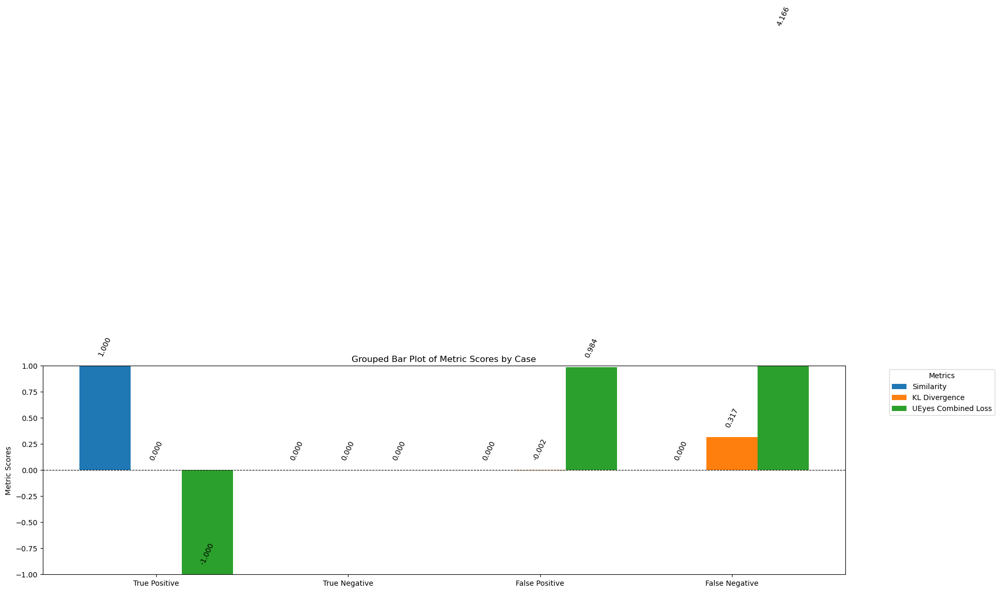

In [26]:
# Define the score methods implemented by us.
our_methods = {
    #"Normalized Scanpath Saliency": nss,
    # "Correlation Coefficient": correlation_coefficient,
    "Similarity": similarity, 
    "KL Divergence": kl_divergence,
    'UEyes Combined Loss': combined_loss_UEyes
}
plot_grouped_barplot(our_methods)

Note that the combined loss on the FN case is very high since the UEyes weighted KLD with a large coefficient of 10 (and KLD mainly penalizes FNs) relative to the other loss terms (3 for CC, 1 for SIM, 0.5 for NSS, 1 for MSE).

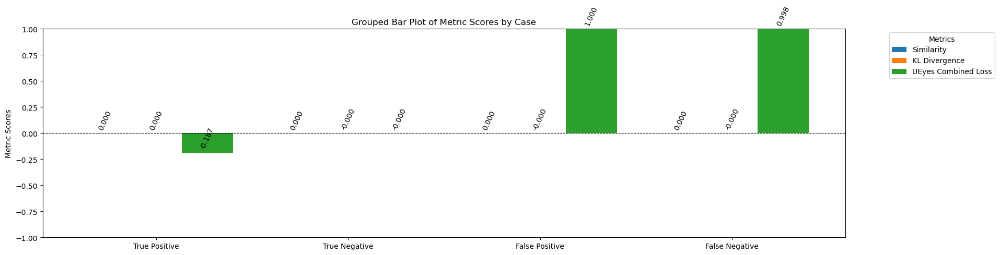

In [27]:
UEyes_methods.pop('Normalized Scanpath Saliency')
UEyes_methods.pop('Correlation Coefficient')
plot_grouped_barplot(UEyes_methods)

In [28]:
# check for equivalence between the implementations
print('Given two batches of 16 samples (i.e. 16 pairs of saliency maps), the two implementations score differently for...')
print('KLD: ', tf.math.count_nonzero(tf.not_equal(kl_divergence(train_data_gen[4][1], train_data_gen[0][1]), kl_divergence_(train_data_gen[4][1], train_data_gen[0][1]))).numpy(), ' samples')
print('NSS: ', tf.math.count_nonzero(tf.not_equal(nss(train_data_gen[4][1], train_data_gen[0][1]), nss_(train_data_gen[4][1], train_data_gen[0][1]))).numpy(), ' samples')
print('SIM: ', tf.math.count_nonzero(tf.not_equal(similarity(train_data_gen[4][1], train_data_gen[0][1]), similarity_(train_data_gen[4][1], train_data_gen[0][1]))).numpy(), ' samples')
print('CC: ', tf.math.count_nonzero(tf.not_equal(correlation_coefficient(train_data_gen[4][1], train_data_gen[0][1]), correlation_coefficient_(train_data_gen[4][1], train_data_gen[0][1]))).numpy(), ' samples')

Given two batches of 16 samples (i.e. 16 pairs of saliency maps), the two implementations score differently for...
KLD:  1  samples
NSS:  16  samples
SIM:  1  samples
CC:  16  samples


tf.Tensor(1.9929847e-05, shape=(), dtype=float32)
tf.Tensor(1.9929847e-05, shape=(), dtype=float32)
tf.Tensor(1.9929847e-05, shape=(), dtype=float32)
tf.Tensor(1.9929847e-05, shape=(), dtype=float32)


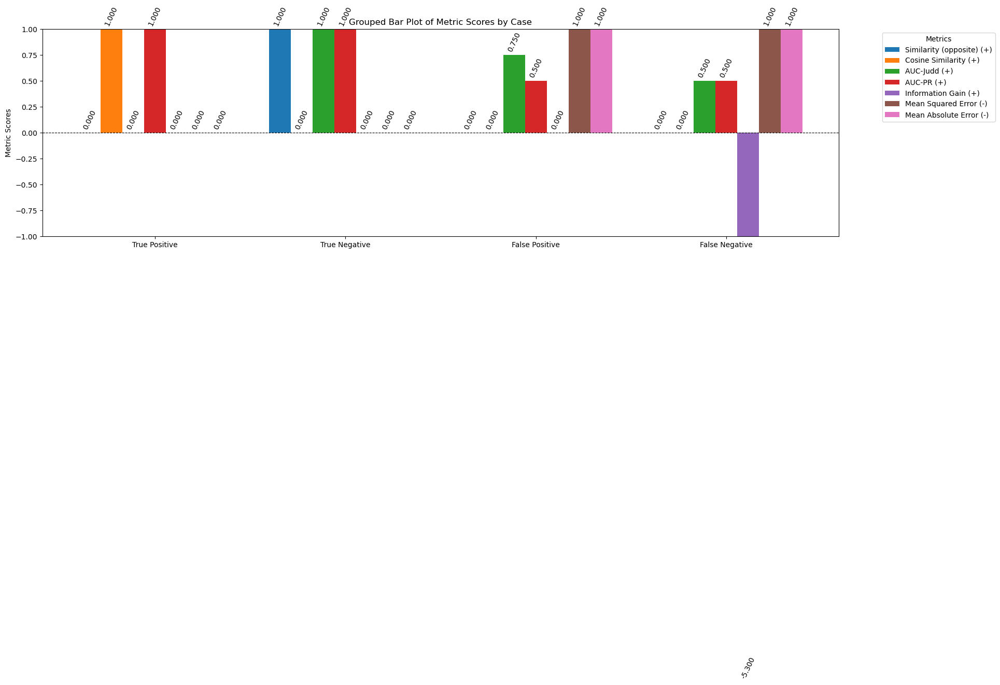

In [29]:
# visualize the remaining metrics implemented by us.
our_methods = {
    #"Normalized Scanpath Saliency (+)": nss,
    #"Correlation Coefficient (+)": correlation_coefficient,
    #"Similarity (+)": similarity, 
    "Similarity (opposite) (+)": similarity_opposite,
    "Cosine Similarity (+)": cosine_similarity,
    "AUC-Judd (+)": tf.keras.metrics.AUC(num_thresholds=100),
    "AUC-PR (+)": tf.keras.metrics.AUC(num_thresholds=100, curve='PR'),
    "Information Gain (+)": information_gain,
    #"KL Divergence (-)": kl_divergence,
    "Mean Squared Error (-)": mse,
    "Mean Absolute Error (-)": mae
}
plot_grouped_barplot(our_methods)

Everything is behaving as expected except AUC-Judd and information gain (IG).
- AUC-Judd on the true positive condition should be perfectly +1. This may be due to AUC being calculated by integrating the ROC curve where the x-axis is the false positive rate FP/(TN+FP). However, since this true positive condition was defined as two identical fully salient (all 1's) maps, there is no negatives. Thus, FP and TN are both 0, resulting in a score of 0 because there's nothing to integrate over despite the high true positive rate on the y-axis.
- Notice that AUC-PR, on the other hand, rewards the true positives/negative equally, as well as the false positive/negatives equally, whereas, AUC-Judd is more lenient toward false positives then false negatives. This suggests that adopting the AUC-PR in place of the AUC-Judd metric may be more appropriate, especially when the UEyes team was facing issues with high FPR.
- IG metric is overshooting the FNs, as expected, but not the FPs....(we will exclude this score for now since the score wasn't outlined in detail and we're unsure if the formula we adopted is correct).

In [30]:
combined_metrics=[tf.keras.metrics.AUC(name='auc_judd', num_thresholds=100),  # AUC-Judd (of ROC curve)
                  tf.keras.metrics.AUC(name='auc_PR', num_thresholds=100, curve='PR'),  # AUC of PR curve
                  nss,       # Normalized Scanpath Saliency
                  #information_gain,  # Information Gain
                  similarity,  # Similarity
                  similarity_opposite,  # Similarity
                  cosine_similarity, # Cosine Similarity
                  correlation_coefficient,  # Correlation Coefficient
                  kl_divergence, # KL Divergence
                  'mae', # Mean Absolute Error
                  'mse'] # Mean Squared Error

# Hyperparameter Tuning

### Loss Term Tuning

In [31]:
# ------------------------------------ Loss Functions ------------------------------------

# MAE, MSE, KLD from before

# Previous loss functions properly wrapped to be used independently:
def nss_loss(y_true, y_pred): 
    return  -nss(y_true, y_pred)

def correlation_coefficient_loss(y_true, y_pred):
    return -correlation_coefficient(y_true, y_pred)

def similarity_loss(y_true, y_pred):
    return -similarity(y_true,y_pred)

def cosine_similarity_loss(y_true, y_pred):
    return -cosine_similarity(y_true, y_pred)

def similarity_opposite_loss(y_true, y_pred):
    return -similarity_opposite(y_true,y_pred)

In [39]:
# define custom objects for reloading the model
custom_objects_dict = {
    'mse': mse,
    'mae': mae,
    'information_gain': information_gain,
    'kl_divergence': kl_divergence,
    'kl_divergence_': kl_divergence_,
    'nss': nss,
    'nss_': nss_,
    'correlation_coefficient': correlation_coefficient,
    'correlation_coefficient_': correlation_coefficient_,
    'similarity': similarity,
    'similarity_': similarity_,
    'cosine_similarity': cosine_similarity,
    'similarity_opposite': similarity_opposite,
    'combined_loss_UEyes': combined_loss_UEyes,
    'batch_sum_normalize': batch_sum_normalize,
    'sum_normalize': sum_normalize,
    'min_max_scaling': min_max_scaling,
    'batch_min_max_scaling': batch_min_max_scaling,
    'batch_min_max_sum_normalize': batch_min_max_sum_normalize,
    'nss_loss': nss_loss,
    'correlation_coefficient_loss': correlation_coefficient_loss,
    'similarity_loss': similarity_loss,
    'combined_loss_UEyes_': combined_loss_UEyes_,
    'cosine_similarity_loss': cosine_similarity_loss,
    'similarity_opposite_loss': similarity_opposite_loss,
}

##### The Simple Copycat Model

In [40]:
# Define the UMSI++ model
def UMSI(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(p1)
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1')(p2)
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1')(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(bottleneck)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(u4)
    
    # Block 5
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u4)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1')(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2')(u5)
    
    # Block 6
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u5)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1')(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2')(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output')(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_simple')  # Use a valid model name
    
    return model

##### Train with **UEyes' combined loss term**

In [41]:
if os.path.exists('UMSI_ueyes.h5'):
    print("Loading saved model...")
    UMSI_ueyes = load_model('UMSI_ueyes.h5', custom_objects=custom_objects_dict)
    history_ueyes = pd.read_csv('history_ueyes.csv')

else:
    print("Training and saving new model...")
    UMSI_ueyes = UMSI(input_shape=(224, 224, 3))
    UMSI_ueyes.compile(optimizer=Adam(learning_rate=0.001), loss = combined_loss_UEyes_, metrics=combined_metrics)
    history_ueyes = UMSI_ueyes.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_ueyes.save('UMSI_ueyes.h5')
    pd.DataFrame(history_ueyes.history).to_csv('history_ueyes.csv', index=False)

Loading saved model...


##### Train with **MAE**

In [45]:
if os.path.exists('UMSI_mae.h5'):
    print("Loading saved model...")
    UMSI_mae = load_model('UMSI_mae.h5', custom_objects=custom_objects_dict)
    history_mae = pd.read_csv('history_mae.csv')

else:
    print("Training and saving new model...")
    UMSI_mae = UMSI(input_shape=(224, 224, 3))
    UMSI_mae.compile(optimizer=Adam(learning_rate=0.001), loss = 'mae', metrics=combined_metrics)
    history_mae = UMSI_mae.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_mae.save('UMSI_mae.h5')
    pd.DataFrame(history_mae.history).to_csv('history_mae.csv', index=False)

Loading saved model...


##### Train with **MSE**

In [46]:
if os.path.exists('UMSI_mse.h5'):
    print("Loading saved model...")
    UMSI_mse = load_model('UMSI_mse.h5', custom_objects=custom_objects_dict)
    history_mse = pd.read_csv('history_mse.csv')

else:
    print("Training and saving new model...")
    UMSI_mse = UMSI(input_shape=(224, 224, 3))
    UMSI_mse.compile(optimizer=Adam(learning_rate=0.001), loss = 'mse', metrics=combined_metrics)
    history_mse = UMSI_mse.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_mse.save('UMSI_mse.h5')
    pd.DataFrame(history_mse.history).to_csv('history_mse.csv', index=False)

Loading saved model...


##### Train with **KL Divergence**

In [47]:
if os.path.exists('UMSI_kld.h5'):
    print("Loading saved model...")
    UMSI_kld = load_model('UMSI_kld.h5', custom_objects=custom_objects_dict)
    history_kld = pd.read_csv('history_kld.csv')

else:
    print("Training and saving new model...")
    UMSI_kld = UMSI(input_shape=(224, 224, 3))
    UMSI_kld.compile(optimizer=Adam(learning_rate=0.001), loss = kl_divergence, metrics=combined_metrics)
    history_kld = UMSI_kld.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_kld.save('UMSI_kld.h5')
    pd.DataFrame(history_kld.history).to_csv('history_kld.csv', index=False)

Loading saved model...


##### Train with **NSS**

In [48]:
if os.path.exists('UMSI_nss.h5'):
    print("Loading saved model...")
    UMSI_nss = load_model('UMSI_nss.h5', custom_objects=custom_objects_dict)
    history_nss = pd.read_csv('history_nss.csv')

else:
    print("Training and saving new model...")
    UMSI_nss = UMSI(input_shape=(224, 224, 3))
    UMSI_nss.compile(optimizer=Adam(learning_rate=0.001), loss = nss_loss, metrics=combined_metrics)
    history_nss = UMSI_nss.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_nss.save('UMSI_nss.h5')
    pd.DataFrame(history_nss.history).to_csv('history_nss.csv', index=False)

Loading saved model...


##### Train with **Correlation Coefficient**

In [49]:
if os.path.exists('UMSI_cc.h5'):
    print("Loading saved model...")
    UMSI_cc = load_model('UMSI_cc.h5', custom_objects=custom_objects_dict)
    history_cc = pd.read_csv('history_cc.csv')

else:
    print("Training and saving new model...")
    UMSI_cc = UMSI(input_shape=(224, 224, 3))
    UMSI_cc.compile(optimizer=Adam(learning_rate=0.001), loss = correlation_coefficient_loss, metrics=combined_metrics)
    history_cc = UMSI_cc.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_cc.save('UMSI_cc.h5')
    pd.DataFrame(history_cc.history).to_csv('history_cc.csv', index=False)

Loading saved model...


##### Train with **Cosine Similarity**

In [50]:
if os.path.exists('UMSI_cs.h5'):
    print("Loading saved model...")
    UMSI_cs = load_model('UMSI_cs.h5', custom_objects=custom_objects_dict)
    history_cs = pd.read_csv('history_cs.csv')

else:
    print("Training and saving new model...")
    UMSI_cs = UMSI(input_shape=(224, 224, 3))
    UMSI_cs.compile(optimizer=Adam(learning_rate=0.001), loss = cosine_similarity_loss, metrics=combined_metrics)
    history_cs = UMSI_cs.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_cs.save('UMSI_cs.h5')
    pd.DataFrame(history_cs.history).to_csv('history_cs.csv', index=False)

Loading saved model...


##### Train with **Similarity Score**

In [51]:
if os.path.exists('UMSI_sim.h5'):
    print("Loading saved model...")
    UMSI_sim = load_model('UMSI_sim.h5', custom_objects=custom_objects_dict)
    history_sim = pd.read_csv('history_sim.csv')

else:
    print("Training and saving new model...")
    UMSI_sim = UMSI(input_shape=(224, 224, 3))
    UMSI_sim.compile(optimizer=Adam(learning_rate=0.001), loss = similarity_loss, metrics=combined_metrics)
    history_sim = UMSI_sim.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_sim.save('UMSI_sim.h5')
    pd.DataFrame(history_sim.history).to_csv('history_sim.csv', index=False)

Loading saved model...


##### Train with **Inverted Similarity Score**

In [52]:
if os.path.exists('UMSI_sim_o.h5'):
    print("Loading saved model...")
    UMSI_sim_o = load_model('UMSI_sim_o.h5', custom_objects=custom_objects_dict)
    history_sim_o = pd.read_csv('history_sim_o.csv')

else:
    print("Training and saving new model...")
    UMSI_sim_o = UMSI(input_shape=(224, 224, 3))
    UMSI_sim_o.compile(optimizer=Adam(learning_rate=0.001), loss = similarity_opposite_loss, metrics=combined_metrics)
    history_sim_o = UMSI_sim_o.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_sim_o.save('UMSI_sim_o.h5')
    pd.DataFrame(history_sim_o.history).to_csv('history_sim_o.csv', index=False)

Loading saved model...


##### Compare their learning and performance

According to the **learning curve** plots below, all models, except for the ones trained with the inverted similarity score as well as MSE or MAE, have been converging nicely, smoother than that of the original model trained with the UEyes combined loss term.
- The training and validation losses for the models trained with NSS, CC, SIM, CS, and KLD have all diverged such that validation loss is greater than training loss, around epochs 4, 5, 6, 7, and 5, respectively. This divergence suggests that they have likely converged to a local optimum and are starting to overfit if the training runs on any longer. For reference, the original UEyes model diverged at epoch 7.
- The model trained with the inverted similarity score is converging but not very smoothly. Thus, it would be inappropriate to solely rely on this loss term. However, the validation loss seems to be lower than the training loss, suggesting that the model may be underfitting and has potential to converge if given enough training epochs.
- Learning plateaus when using MSE or MAE loss. These models may be running to the vanishing gradients problem.

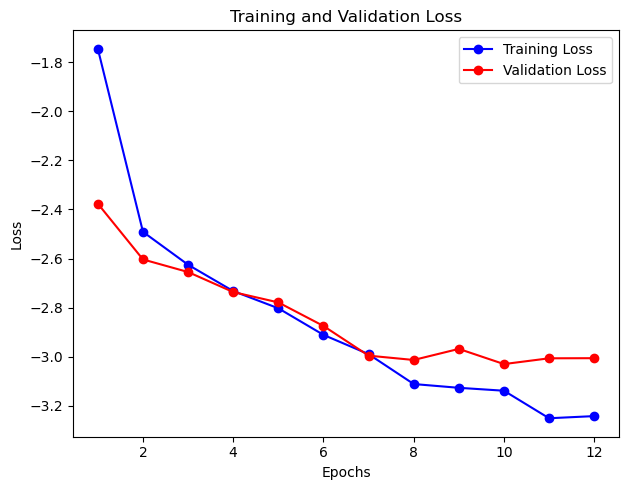

In [53]:
plot_learning_curve(history_ueyes)

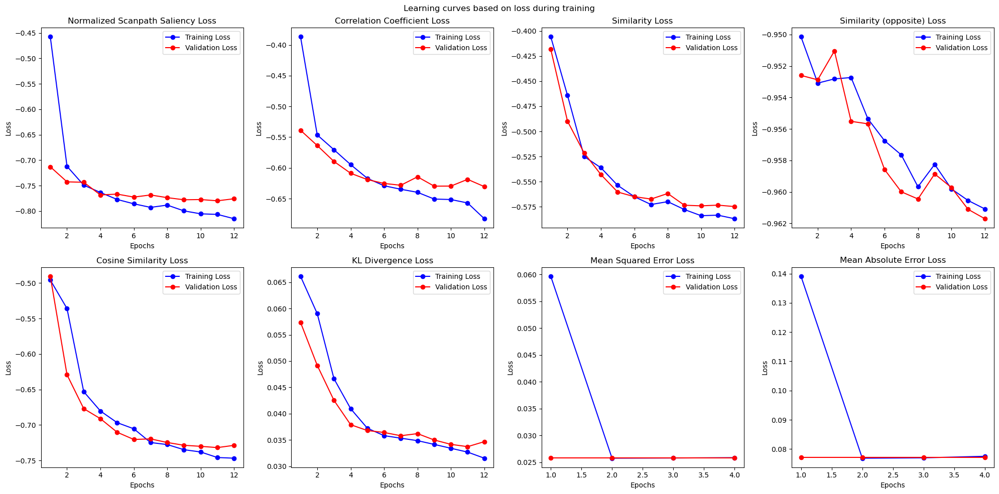

In [54]:
hist_dict = {"Normalized Scanpath Saliency": history_nss,
    "Correlation Coefficient": history_cc,
    "Similarity": history_sim, 
    "Similarity (opposite)": history_sim_o,
    "Cosine Similarity": history_cs,
    "KL Divergence": history_kld,
    "Mean Squared Error": history_mse,
    "Mean Absolute Error": history_mae}

plot_learning_curves(hist_dict)

From **visually comparing** each model's predicted saliency map to the ground truth for **a sample UI image**, we notice that all the models are prone to generating a horizontal noise pattern. They seem to predict similar areas as saliency, though with varying strengths of saliency. 
- The model trained with similarity (opposite) loss exhibits it the horizontal noise but generates much harder boundaries than the rest.
- The predicted maps by the models trained with MSE and MAE further confirms that the gradients were vanishing during training, leading predicting all 0's (since weights were initialized close to 0, and without gradients, they don't change).
- The models all seems to have caught the eye fixation patterns near the top of the image but all predicts the most salient area to be lower on the image and wider than the ground truth. 
- Some features from the input image are "leaking through" to the saliency map generated by the correlation coefficient loss model which may be due to the concatenation layers in the decoder which reaches back to the earliest layers in the encoder, recovering features closer to the input image. 

2025-03-21 02:43:39.213697: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2025-03-21 02:43:39.410584: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2025-03-21 02:43:40.265676: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2025-03-21 02:43:40.668217: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2025-03-21 02:43:41.060479: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2025-03-21 02:43:41.471940: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


2025-03-21 02:43:41.955308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


2025-03-21 02:43:42.437254: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2025-03-21 02:43:42.850165: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2025-03-21 02:43:43.261828: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


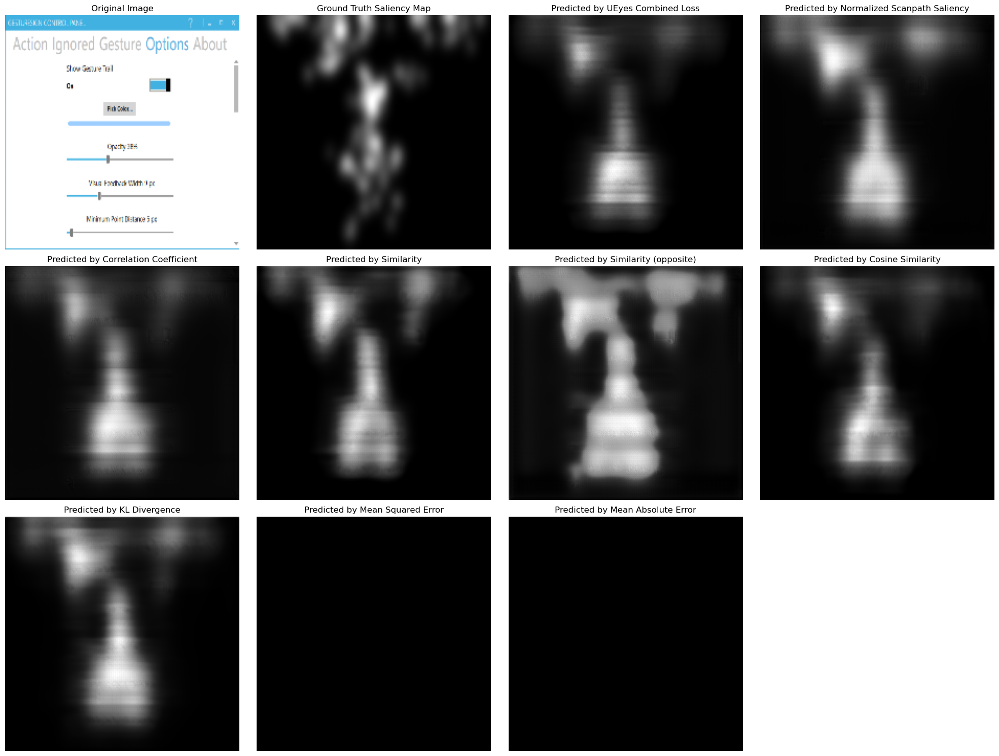

In [55]:
mod_dict = {"UEyes Combined Loss": UMSI_ueyes,
    "Normalized Scanpath Saliency": UMSI_nss,
    "Correlation Coefficient": UMSI_cc,
    "Similarity": UMSI_sim, 
    "Similarity (opposite)": UMSI_sim_o,
    "Cosine Similarity": UMSI_cs,
    "KL Divergence": UMSI_kld,
    "Mean Squared Error": UMSI_mse,
    "Mean Absolute Error": UMSI_mae}
compare_visualized_results(mod_dict, test_data_gen_desktop)

Finally, we can evaluate the models based on their performance across the **evaluation metrics**.

(Note that lower loss, KLD, MAE, MSE is better)

- As our goal is to improve upon the original UEyes loss term, consider the UEyes Combined Loss model (blue) as the baseline performances.
- Looking at the AUC metrics (the only two metrics outside out the loss functions themselves), we see that the UEyes model is performing similarly to the other models (except the MAE and MSE ones). All model's performance also slightly droped going from training to testing.
- The MSE and MAE models are scoring the worse on almost all metrics except MAE/MSE (which is expected since they are redundant with what the models were optimizing), similarity opposite, and the AUC metrics. We will no longer consider them as a loss function candidates for the combined loss term due to the vanishing gradients.
- The models are scoring high across the board on the similarity opposite metric, suggesting it is not a very informative metric and can be removed.

Now, ignoring the MAE/MSE models, we can look at...
- NSS Model: scoring low in SIM, highest in MAE and MSE, about average on the rest.
- CC Model: highest NSS score, lowest SIM and lowest CS score, highest KLD (following the MAE/MSE models), second highest MAE/MSE following the NSS model.
- SIM Model: highest on the CS score, second highest on the CC score, very low MAE/MSE.
- SIM Opposite Model: third highest MAE/MSE, second highest KLD (following the MAE/MSE models), second highest CC and NSS scores.
- CS Model: doing relevatively well, but not exceptional, across all metrics.
- KLD model: doing relevatively well, but not exceptional, across all metrics but slightly higher MSE/MAE than the other models performing well on those metrics.

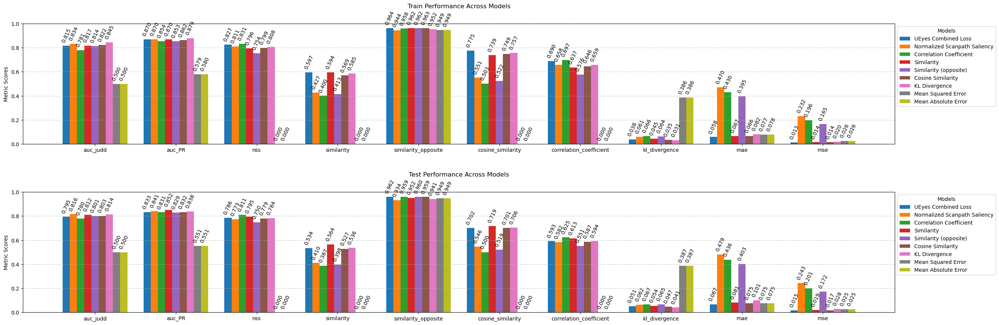

In [121]:
train_performance_all, test_performance_all = compare_train_test_performance(mod_dict)

In [62]:
train_performance_all

,loss,auc_judd,auc_PR,nss,similarity,similarity_opposite,cosine_similarity,correlation_coefficient,kl_divergence,mae,mse
Model Name,,,,,,,,,,,
UEyes Combined Loss,-3.313513040542603,0.814614772796631,0.868937969207764,0.828628063201904,0.596512079238892,0.963589251041412,0.775849282741547,0.691214323043823,0.038092028349638,0.057571586221457,0.013021340593696
Normalized Scanpath Saliency,-0.809223711490631,0.833186149597168,0.869610249996185,0.809223711490631,0.427087813615799,0.943209350109100,0.551846981048584,0.656926810741425,0.060519877821207,0.470327496528625,0.232430323958397
Correlation Coefficient,-0.696736097335815,0.779978871345520,0.853802144527435,0.831001758575439,0.400639474391937,0.958343505859375,0.503059864044189,0.696736097335815,0.066151529550552,0.430124014616013,0.195860564708710
Similarity,-0.596581935882568,0.817779660224915,0.869809389114380,0.797534584999084,0.596581935882568,0.962359845638275,0.740655124187469,0.639568507671356,0.044541269540787,0.066138878464699,0.013912351801991
Similarity (opposite),-0.962116241455078,0.813474416732788,0.852819204330444,0.752353370189667,0.413039088249207,0.962116241455078,0.522827982902527,0.574430346488953,0.063624747097492,0.395094662904739,0.165388882160187
Cosine Similarity,-0.749056696891785,0.821277201175690,0.862184762954712,0.797445118427277,0.568827390670776,0.963247835636139,0.749056696891785,0.644895017147064,0.035024106502533,0.066236458718777,0.014129263348877
KL Divergence,0.031092679128051,0.844748139381409,0.877945184707642,0.807601034641266,0.582391440868378,0.952344119548798,0.756963253021240,0.658485889434814,0.031092679128051,0.082178160548210,0.020131576806307
Mean Squared Error,0.025863388553262,0.500000000000000,0.579507708549500,0.000000000000000,0.000000000000000,0.949009716510773,0.000000000000000,0.000000000000000,0.386047601699829,0.077245056629181,0.025863390415907
Mean Absolute Error,0.077175423502922,0.500000000000000,0.577368974685669,0.000000000000000,0.000000000000000,0.948943078517914,0.000000000000000,0.000000000000000,0.386319875717163,0.077175416052341,0.025868499651551


In [63]:
test_performance_all

,loss,auc_judd,auc_PR,nss,similarity,similarity_opposite,cosine_similarity,correlation_coefficient,kl_divergence,mae,mse
Model Name,,,,,,,,,,,
UEyes Combined Loss,-2.849863052368164,0.794576466083527,0.832733511924744,0.786402463912964,0.533551573753357,0.961950778961182,0.701637983322144,0.593100547790527,0.051162917166948,0.067003004252911,0.015335338190198
Normalized Scanpath Saliency,-0.773423373699188,0.815743565559387,0.841372430324554,0.773423373699188,0.410463511943817,0.933588624000549,0.545858025550842,0.582160592079163,0.061825565993786,0.479308158159256,0.242677330970764
Correlation Coefficient,-0.625072836875916,0.779993414878845,0.831121087074280,0.811175823211670,0.386835396289825,0.959151148796082,0.499794453382492,0.625072836875916,0.067159622907639,0.435784548521042,0.200768262147903
Similarity,-0.563831031322479,0.812137305736542,0.852407515048981,0.794971823692322,0.563831031322479,0.951646447181702,0.718709409236908,0.613304018974304,0.054391779005527,0.081407509744167,0.018955986946821
Similarity (opposite),-0.959928631782532,0.801381707191467,0.828646063804626,0.749671816825867,0.397546917200089,0.959928631782532,0.519475698471069,0.551128983497620,0.064692579209805,0.402900844812393,0.172225803136826
Cosine Similarity,-0.700548112392426,0.802652359008789,0.832374691963196,0.778621196746826,0.527004003524780,0.959118008613586,0.700548112392426,0.586525440216064,0.046934522688389,0.075412154197693,0.016723385080695
KL Divergence,0.041262540966272,0.814321994781494,0.838221549987793,0.784112930297852,0.536483287811279,0.940601587295532,0.706172347068787,0.594137489795685,0.041262540966272,0.101238213479519,0.027984945103526
Mean Squared Error,0.025299824774265,0.500000000000000,0.551039099693298,0.000000000000000,0.000000000000000,0.949225366115570,0.000000000000000,0.000000000000000,0.387393921613693,0.075141578912735,0.025299824774265
Mean Absolute Error,0.075141578912735,0.500000000000000,0.551039099693298,0.000000000000000,0.000000000000000,0.949225366115570,0.000000000000000,0.000000000000000,0.387393921613693,0.075141578912735,0.025299824774265


##### Define the new combined loss term based on observations

In [66]:
# ------------------------------------ Combined Loss Terms ------------------------------------
def combined_loss_ours(y_true, y_pred):
    '''
    Returns a combined loss term with the specified weights that can be used in model.compile().
    Excluding MSE and MAE.
    '''

    # loss term weights
    kl_weight=2.0
    nss_weight=0.25 # 0.5, relative to others (halved to account for [-1,1] range)
    cc_weight=0.5 # 1.0, relative to others (halved to account for [-1,1] range)
    cs_weight=1.0 # 2.0, relative to others (halved to account for [-1,1] range)
    s_weight=4.0
    so_weight=0.5

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    n = nss_loss(y_true, y_pred)
    c = correlation_coefficient_loss(y_true, y_pred)
    cs = cosine_similarity_loss(y_true, y_pred)
    s = similarity_loss(y_true, y_pred)
    so = similarity_opposite_loss(y_true, y_pred)
    
    # combined loss
    return kl_weight*k + nss_weight*n + cc_weight*c + cs_weight*cs + s_weight*s + so_weight*so

# append the custom object
custom_objects_dict['combined_loss_ours'] = combined_loss_ours

##### Train the simple copycat model with the new combined loss term

In [67]:
if os.path.exists('UMSI_ours.h5'):
    print("Loading saved model...")
    UMSI_ours = load_model('UMSI_ours.h5', custom_objects=custom_objects_dict)
    history_ours = pd.read_csv('history_ours.csv')

else:
    print("Training and saving new model...")
    UMSI_ours = UMSI(input_shape=(224, 224, 3))
    UMSI_ours.compile(optimizer=Adam(learning_rate=0.001), loss = combined_loss_ours, metrics=combined_metrics)
    history_ours = UMSI_ours.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_ours.save('UMSI_ours.h5')
    pd.DataFrame(history_ours.history).to_csv('history_ours.csv', index=False)

Loading saved model...


Compared to the original UEyes loss term, training with our loss term results in smoother convergence. According to the 5 test samples, our model also have visibly less horizontal noise, sharper saliency predictions, and detects nuanced saliency areas that the UEyes model tend to dismiss. However, these are at a cost of overpredicting saliency, thus, may not be improving upon the original model in terms of false positive rate. As demonstrated by the table below, our model decreased in KLD by 19.60%, in MAE was by 17.76%, and in MSE by 22.90% compared to the UEyes model with slight improvements around 1-3% across the remaining metrics, notably, 3.16% in AUC-Judd and 1.98% in AUC-PR.

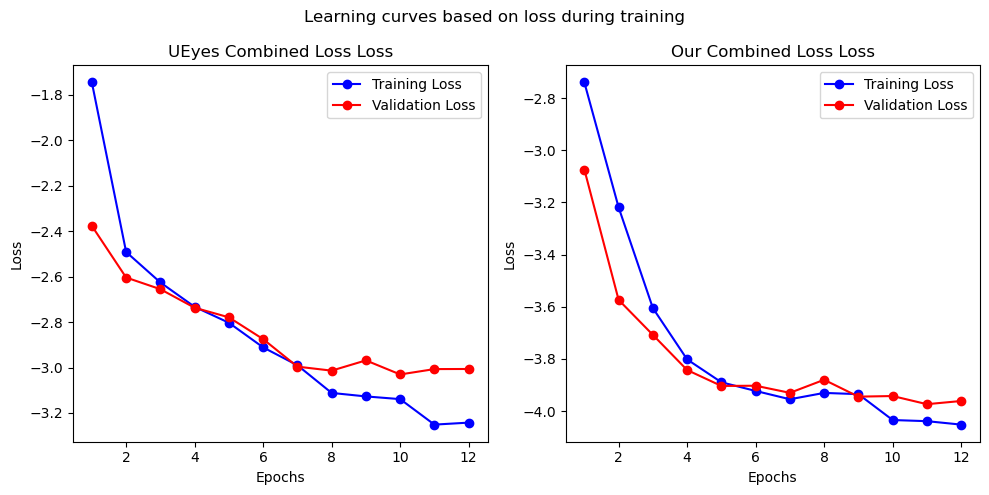

In [68]:
plot_learning_curves({"UEyes Combined Loss": history_ueyes, "Our Combined Loss": history_ours})

2025-03-21 03:13:45.176843: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


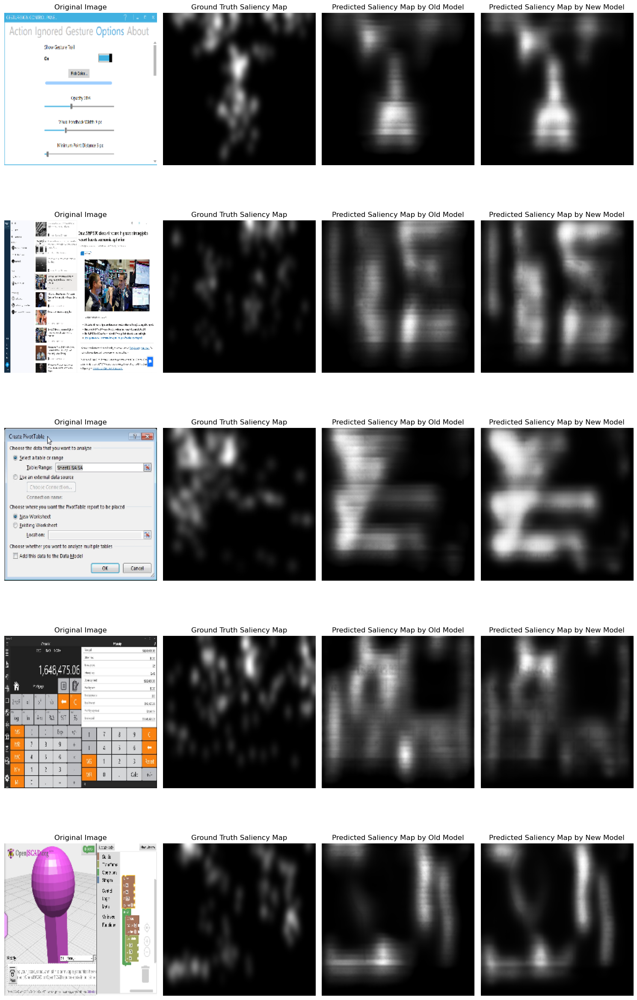

In [ ]:
compare_2_models_visualized_results(UMSI_ueyes, UMSI_ours, test_data_gen_desktop, num_samples=5)

In [ ]:
test_performance_ueyes = test_performance_all.loc['UEyes Combined Loss']
test_performance_ueyes = test_performance_ueyes.drop(['loss'])
test_performance_ours = test_data_performance(UMSI_ours, test_data_gen_desktop)
test_performance_ours = test_performance_ours.drop(columns=['loss'])
percent_improvement_ueyes_ours = ((test_performance_ours - test_performance_ueyes)/test_performance_ueyes)*100
percent_improvement_ueyes_ours['kl_divergence'] *= -1 # invert the KLD scale
percent_improvement_ueyes_ours['mse'] *= -1 # invert the MSE scale
percent_improvement_ueyes_ours['mae'] *= -1 # invert the MAE scale
percent_improvement_ueyes_ours

,auc_judd,auc_PR,nss,similarity,similarity_opposite,cosine_similarity,correlation_coefficient,kl_divergence,mae,mse
0,3.159874879048722,1.978942018975088,1.518284107104906,2.306080203228282,-0.635776166538694,1.884155775136151,2.960311041290474,19.599188608717629,-17.763856318770920,-22.899790929221410


### Architecture Tuning

(trained using the new combined loss term)

##### Model with negative output bias

In [73]:
# Define the UMSI++ model
def UMSI_neg_bias(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(p1)
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1')(p2)
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1')(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(bottleneck)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(u4)
    
    # Block 5
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u4)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1')(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2')(u5)
    
    # Block 6
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u5)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1')(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2')(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    # Define a custom bias initializer
    negative_bias_initializer = tf.keras.initializers.Constant(-1.0)  # Adjust the value as needed
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output', bias_initializer=negative_bias_initializer)(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_neg_bias')  # Use a valid model name
    
    return model

In [74]:
if os.path.exists('UMSI_nb.h5'):
    print("Loading saved model...")
    UMSI_nb = load_model('UMSI_nb.h5', custom_objects=custom_objects_dict)
    history_nb = pd.read_csv('history_nb.csv')

else:
    print("Training and saving new model...")
    UMSI_nb = UMSI_neg_bias(input_shape=(224, 224, 3))
    UMSI_nb.compile(optimizer=Adam(learning_rate=0.001), loss = combined_loss_ours, metrics=combined_metrics)
    history_nb = UMSI_nb.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_nb.save('UMSI_nb.h5')
    pd.DataFrame(history_nb.history).to_csv('history_nb.csv', index=False)

Training and saving new model...
Epoch 1/12


2025-03-21 03:17:44.228637: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - ETA: 0s - loss: -2.9262 - auc_judd: 0.6612 - auc_PR: 0.7304 - nss: 0.5536 - similarity: 0.4312 - similarity_opposite: 0.8761 - cosine_similarity: 0.5516 - correlation_coefficient: 0.3873 - kl_divergence: 0.0601 - mae: 0.3576 - mse: 0.1676

2025-03-21 03:18:15.089279: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 39s 2s/step - loss: -2.9262 - auc_judd: 0.6612 - auc_PR: 0.7304 - nss: 0.5536 - similarity: 0.4312 - similarity_opposite: 0.8761 - cosine_similarity: 0.5516 - correlation_coefficient: 0.3873 - kl_divergence: 0.0601 - mae: 0.3576 - mse: 0.1676 - val_loss: -3.2095 - val_auc_judd: 0.7454 - val_auc_PR: 0.7973 - val_nss: 0.6975 - val_similarity: 0.4555 - val_similarity_opposite: 0.9245 - val_cosine_similarity: 0.6025 - val_correlation_coefficient: 0.5159 - val_kl_divergence: 0.0548 - val_mae: 0.2673 - val_mse: 0.0904 - lr: 0.0010
Epoch 2/12
17/17 [==============================] - 24s 1s/step - loss: -3.3978 - auc_judd: 0.7490 - auc_PR: 0.8035 - nss: 0.7042 - similarity: 0.4973 - similarity_opposite: 0.8386 - cosine_similarity: 0.6486 - correlation_coefficient: 0.5225 - kl_divergence: 0.0484 - mae: 0.3027 - mse: 0.1511 - val_loss: -3.6182 - val_auc_judd: 0.8008 - val_auc_PR: 0.8343 - val_nss: 0.7345 - val_similarity: 0.5226 - val_similarity_opposite:

##### Model with batch normalization layers
(to combat potentially vanishing gradients)

In [75]:
from keras.layers import BatchNormalization
# Define the UMSI++ model
def UMSI_batch_norm(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    x1 = BatchNormalization(name="block1_conv2_BN")(x1) # added
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(p1)
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    x2 = BatchNormalization(name="block2_conv2_BN")(x2) # added
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1')(p2)
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    x3 = BatchNormalization(name="block3_conv2_BN")(x3) # added
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1')(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    bottleneck = BatchNormalization(name="bottleneck_conv2_BN")(bottleneck) # added
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(bottleneck)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(u4)
    u4 = BatchNormalization(name="block4_conv2_BN")(u4) # added
    
    # Block 5
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u4)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1')(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2')(u5)
    u5 = BatchNormalization(name="block5_conv2_BN")(u5) # added
    
    # Block 6
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u5)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1')(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2')(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output')(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_neg_bias')  # Use a valid model name
    
    return model

In [76]:
if os.path.exists('UMSI_bn.h5'):
    print("Loading saved model...")
    UMSI_bn = load_model('UMSI_bn.h5', custom_objects=custom_objects_dict)
    history_bn = pd.read_csv('history_bn.csv')

else:
    print("Training and saving new model...")
    UMSI_bn = UMSI_batch_norm(input_shape=(224, 224, 3))
    UMSI_bn.compile(optimizer=Adam(learning_rate=0.001), loss = combined_loss_ours, metrics=combined_metrics)
    history_bn = UMSI_bn.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_bn.save('UMSI_bn.h5')
    pd.DataFrame(history_bn.history).to_csv('history_bn.csv', index=False)

Loading saved model...


##### Model with L2 regularizers and dropout layers (in decoder) to prevent overfitting

remove batch normalization layers after pooling layers, add them after bottleneck layer
**specified weight initializations to try to address vanishing gradients** and **added weight regularizers and dropout layers to prevent overfitting** (training for a few more epochs bc added regularizations)

In [77]:
# Define the UMSI++ model
def UMSI_regularized(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(inputs)
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(p1)
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(p2)
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(bottleneck)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = Dropout(0.3)(u4) # added
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(u4)
    
    # Block 5
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u4)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = Dropout(0.3)(u5) # added
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2')(u5)
    
    # Block 6
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u5)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = Dropout(0.3)(u6) # added
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2')(u6)
    u6 = Dropout(0.3)(u6) # added
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output')(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_neg_bias')  # Use a valid model name
    
    return model

In [78]:
if os.path.exists('UMSI_reg.h5'):
    print("Loading saved model...")
    UMSI_reg = load_model('UMSI_reg.h5', custom_objects=custom_objects_dict)
    history_reg = pd.read_csv('history_reg.csv')

else:
    print("Training and saving new model...")
    UMSI_reg = UMSI_regularized(input_shape=(224, 224, 3))
    UMSI_reg.compile(optimizer=Adam(learning_rate=0.001), loss = combined_loss_ours, metrics=combined_metrics)
    history_reg = UMSI_reg.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_reg.save('UMSI_reg.h5')
    pd.DataFrame(history_reg.history).to_csv('history_reg.csv', index=False)

Training and saving new model...
Epoch 1/12


2025-03-21 03:24:21.700260: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - ETA: 0s - loss: -2.6895 - auc_judd: 0.6117 - auc_PR: 0.6965 - nss: 0.4640 - similarity: 0.4119 - similarity_opposite: 0.8544 - cosine_similarity: 0.5195 - correlation_coefficient: 0.3145 - kl_divergence: 0.0640 - mae: 0.5529 - mse: 0.3340

2025-03-21 03:24:52.695028: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 40s 2s/step - loss: -2.6895 - auc_judd: 0.6117 - auc_PR: 0.6965 - nss: 0.4640 - similarity: 0.4119 - similarity_opposite: 0.8544 - cosine_similarity: 0.5195 - correlation_coefficient: 0.3145 - kl_divergence: 0.0640 - mae: 0.5529 - mse: 0.3340 - val_loss: -2.9729 - val_auc_judd: 0.7779 - val_auc_PR: 0.8059 - val_nss: 0.6963 - val_similarity: 0.4297 - val_similarity_opposite: 0.8585 - val_cosine_similarity: 0.5552 - val_correlation_coefficient: 0.5166 - val_kl_divergence: 0.0600 - val_mae: 0.5447 - val_mse: 0.3179 - lr: 0.0010
Epoch 2/12
17/17 [==============================] - 29s 2s/step - loss: -3.0194 - auc_judd: 0.7525 - auc_PR: 0.8070 - nss: 0.7053 - similarity: 0.4408 - similarity_opposite: 0.8192 - cosine_similarity: 0.5684 - correlation_coefficient: 0.5152 - kl_divergence: 0.0583 - mae: 0.5486 - mse: 0.3293 - val_loss: -3.0975 - val_auc_judd: 0.7492 - val_auc_PR: 0.8099 - val_nss: 0.7138 - val_similarity: 0.4490 - val_similarity_opposite:

##### Model with less skip connections back to encoder

Across the board, features from the UI image inputs seems to be "leaking through" to the output. This may be due to excessive skip connections extracting features from early layers. We'll remove the last skip connection and attenuate the other two skip connections to reduce their influence and see if the feature leakage persists.

In [82]:
from keras.layers import Multiply

In [83]:
# Define the UMSI++ model
def UMSI_skip(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(p1)
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1')(p2)
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1')(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(bottleneck)
    attenuated_x3 = Conv2D(64, (1, 1), activation='sigmoid', name='attenuate_x3')(x3)  # Learned weighting
    u4 = concatenate([u4, Multiply()([u4, attenuated_x3])], name='block4_concat')
    #u4 = concatenate([u4, x3], name='block4_concat')
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(u4)
    
    # Block 5
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u4)
    attenuated_x2 = Conv2D(64, (1, 1), activation='sigmoid', name='attenuate_x2')(x2)  # Learned weighting
    u5 = concatenate([u5, Multiply()([u5, attenuated_x2])], name='block5_concat')
    #u5 = concatenate([u5, x2], name='block5_concat')
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1')(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2')(u5)
    
    # Block 6
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u5)
    #u6 = concatenate([u6, x1], name='block6_concat') # don't connect to the shallowest encoder layer
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1')(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2')(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output')(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_simple')  # Use a valid model name
    
    return model

In [84]:
if os.path.exists('UMSI_skip.h5'):
    print("Loading saved model...")
    UMSI_skip = load_model('UMSI_skip.h5', custom_objects=custom_objects_dict)
    history_skip = pd.read_csv('history_skip.csv')

else:
    print("Training and saving new model...")
    UMSI_skip = UMSI_regularized(input_shape=(224, 224, 3))
    UMSI_skip.compile(optimizer=Adam(learning_rate=0.001), loss = combined_loss_ours, metrics=combined_metrics)
    history_skip = UMSI_skip.fit(train_data_gen, validation_data=valid_data_gen, verbose=1, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True), tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)])
    UMSI_skip.save('UMSI_skip.h5')
    pd.DataFrame(history_skip.history).to_csv('history_skip.csv', index=False)

Training and saving new model...
Epoch 1/12


2025-03-21 03:53:25.915832: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - ETA: 0s - loss: -2.6679 - auc_judd: 0.6180 - auc_PR: 0.6875 - nss: 0.4608 - similarity: 0.4076 - similarity_opposite: 0.8619 - cosine_similarity: 0.5126 - correlation_coefficient: 0.3180 - kl_divergence: 0.0650 - mae: 0.5644 - mse: 0.3477

2025-03-21 03:54:14.942387: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


17/17 [==============================] - 56s 3s/step - loss: -2.6679 - auc_judd: 0.6180 - auc_PR: 0.6875 - nss: 0.4608 - similarity: 0.4076 - similarity_opposite: 0.8619 - cosine_similarity: 0.5126 - correlation_coefficient: 0.3180 - kl_divergence: 0.0650 - mae: 0.5644 - mse: 0.3477 - val_loss: -2.9654 - val_auc_judd: 0.7862 - val_auc_PR: 0.8123 - val_nss: 0.7055 - val_similarity: 0.4298 - val_similarity_opposite: 0.8369 - val_cosine_similarity: 0.5539 - val_correlation_coefficient: 0.5204 - val_kl_divergence: 0.0601 - val_mae: 0.5824 - val_mse: 0.3611 - lr: 0.0010
Epoch 2/12
17/17 [==============================] - 35s 2s/step - loss: -3.0146 - auc_judd: 0.7593 - auc_PR: 0.8111 - nss: 0.7091 - similarity: 0.4378 - similarity_opposite: 0.8377 - cosine_similarity: 0.5641 - correlation_coefficient: 0.5200 - kl_divergence: 0.0588 - mae: 0.5452 - mse: 0.3225 - val_loss: -3.0968 - val_auc_judd: 0.7373 - val_auc_PR: 0.8076 - val_nss: 0.7149 - val_similarity: 0.4514 - val_similarity_opposite:

##### Evaluate the architecture variants

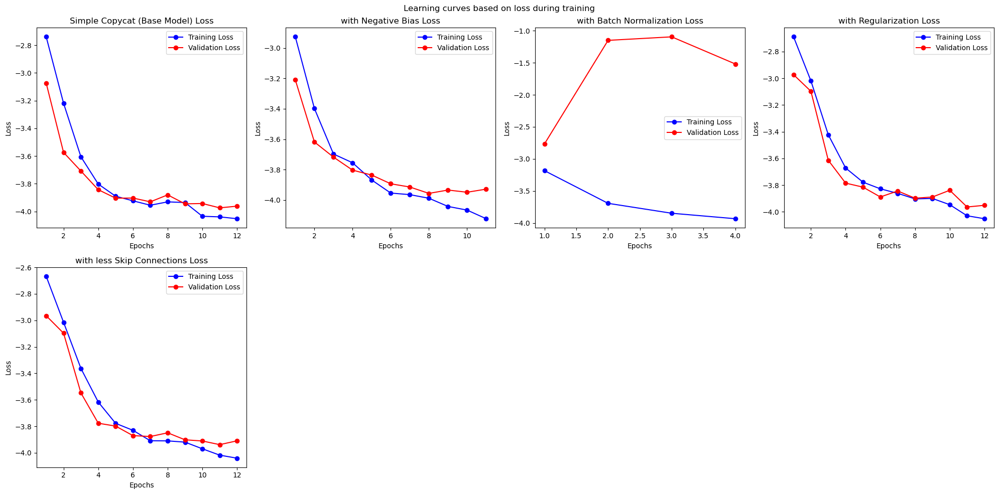

In [ ]:
plot_learning_curves({"Simple Copycat (Base Model)": history_ours, 
                      "with Negative Bias": history_nb, 
                      "with Batch Normalization": history_bn, 
                      "with Regularization": history_reg,
                      "with less Skip Connections": history_skip})

All model variants converged except the one using batch normalization which doesn't seem to be learning effectively at all. The model using negative bias seems to be begining to overfit as the validation loss pleateaued (almost increasing) and learning was stopped early. The models with regularization and with less skip connections started to diverge in training and validation loss similar to the original model at around epoch 9 with similar looking learning curves patterns, suggesting they have converged similarly.

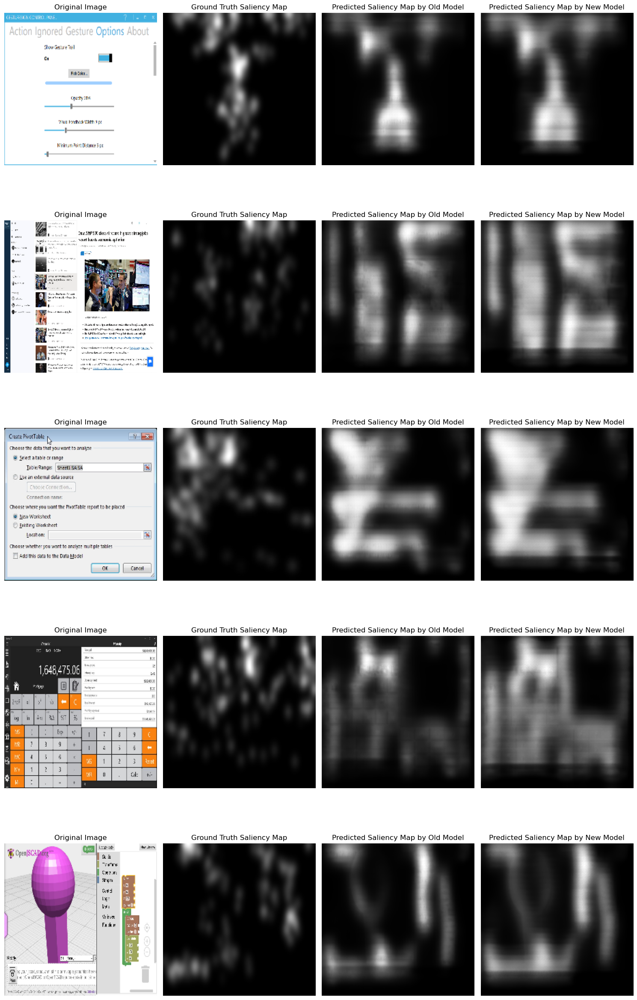

In [86]:
compare_2_models_visualized_results(UMSI_ours, UMSI_nb, test_data_gen_desktop, num_samples=5)

The hope that negative bias would suppress the overall saliency produced by the model didn't pan out as it actually produced more saliency then before. By only initializing the output layer's bias with a negative constant, it is still a learnable parameter and may have given the model more opportunity to lean toward its high false positive tendencies.

2025-03-21 03:37:22.635360: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


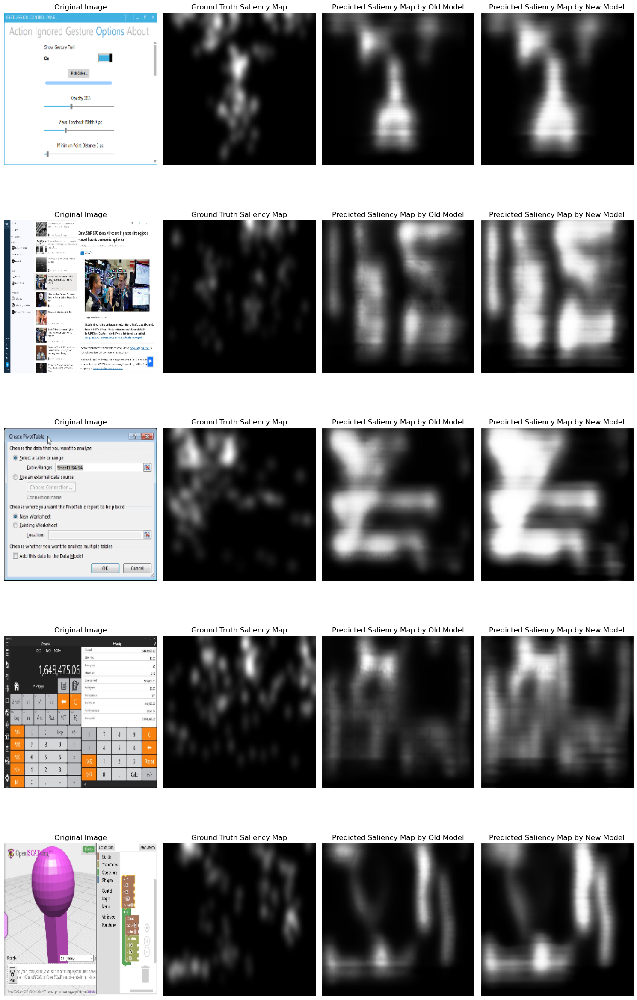

In [81]:
compare_2_models_visualized_results(UMSI_ours, UMSI_reg, test_data_gen_desktop, num_samples=5)

Similarly, the model with added batch normalization layers is predicted more saliency then before and marks similar areas as salient. However it exhibits less feature leakage from the input image perhaps by preventing the model from over relying on early-layer features.

2025-03-21 04:01:35.199414: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


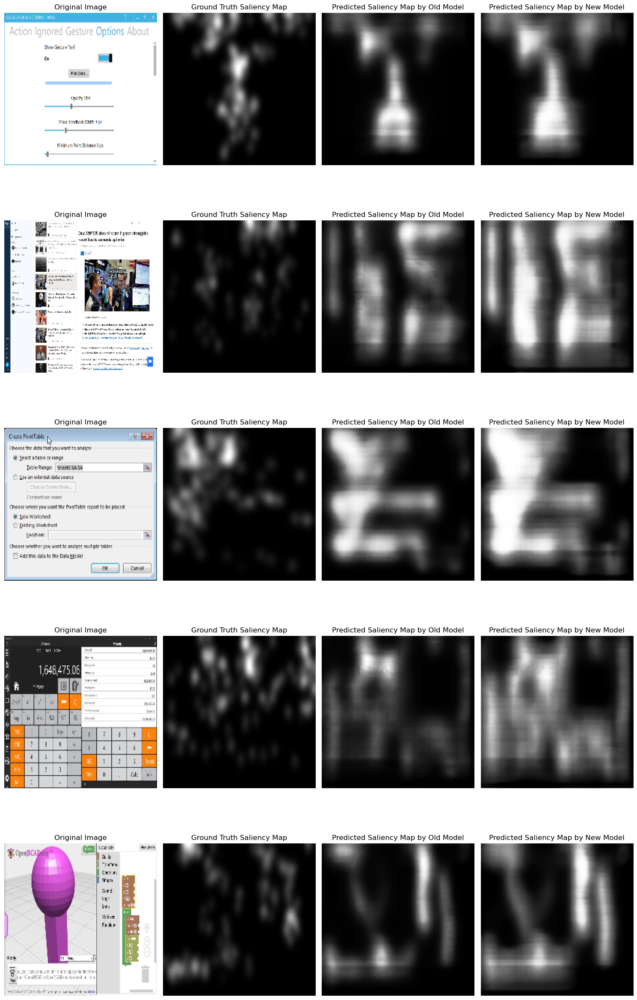

In [87]:
compare_2_models_visualized_results(UMSI_ours, UMSI_skip, test_data_gen_desktop, num_samples=5)

With less skip connections, the feature leakage indeed seems to be reduced though at a cost of high saliency predictions. This model also has a stronger square shaped noise compare to the original model.

In [109]:
# compare each architecture's % improvement from UMSI_ours
test_performance_nb = test_data_performance(UMSI_nb, test_data_gen_desktop)
test_performance_nb = test_performance_nb.drop(columns=['loss'])
test_performance_bn = test_data_performance(UMSI_bn, test_data_gen_desktop)
test_performance_bn = test_performance_bn.drop(columns=['loss'])
test_performance_reg = test_data_performance(UMSI_reg, test_data_gen_desktop)
test_performance_reg = test_performance_reg.drop(columns=['loss'])
test_performance_skip = test_data_performance(UMSI_skip, test_data_gen_desktop)
test_performance_skip = test_performance_skip.drop(columns=['loss'])

percent_improvement_architecture = pd.concat([test_performance_nb, test_performance_bn, test_performance_reg, test_performance_skip], axis=0)
percent_improvement_architecture["Model Name"] = ["With Negative Bias", "With Batch Normalization", "With Regularization", "Less Skip Connections"]
percent_improvement_architecture = percent_improvement_architecture.set_index('Model Name')
percent_improvement_architecture = (percent_improvement_architecture.subtract(test_performance_ours.squeeze(axis=0), axis=1))
percent_improvement_architecture = (percent_improvement_architecture.divide(test_performance_ours.squeeze(axis=0), axis=1))
percent_improvement_architecture *= 100
percent_improvement_architecture['kl_divergence'] *= -1 # invert the KLD scale
percent_improvement_architecture['mse'] *= -1 # invert the MSE scale
percent_improvement_architecture['mae'] *= -1 # invert the MAE scale
percent_improvement_architecture

,auc_judd,auc_PR,nss,similarity,similarity_opposite,cosine_similarity,correlation_coefficient,kl_divergence,mae,mse
Model Name,,,,,,,,,,
With Negative Bias,0.597905020041787,-0.013272571952816,-1.179300133843902,0.153255006393906,-1.230343829158552,-0.111203514354567,-1.490325563017953,-1.053494774592020,-22.194877991043477,-27.692112010336750
With Batch Normalization,-29.077749104004162,-20.176099165133465,-42.438715477818697,-26.083204965658759,-3.465062185053375,-25.933740148479245,-50.112555763003428,-51.068500842223472,-119.562545388585775,-154.704159991160708
With Regularization,1.097308125782567,0.605905894446766,0.383359336345686,0.983037777386375,-7.095262738811302,0.946509750506240,0.736534303470991,-2.288520403542772,-112.461138494685756,-280.874716199373836
Less Skip Connections,0.775151746831028,0.702358397765435,-1.967229858292106,0.014402803949666,-6.500915519583164,-1.300631701331224,-3.164699295588232,-6.426047345637645,-116.115755895405442,-253.680219487967491


Further supporting the observations, the model with batch normalization hurt performance by large across all metrics. The negative output bias model improved performance by an negligible portion in terms of AUC-Judd and similarity score, but hurt performance across the rest. Results were similar for the models with regularization and less skip connections. All the model variants increased MSE and MAE by a lot. The negative bias model did so the least (-27,69%, -22.19%, respsectively) with the other three models essentially doubling or even tripling the original model's MSE and MSE. We can also see they inflated the MSE more than MAE, suggesting there are many large discrepancies between the predicted and ground truth maps, perhaps by not accommodating well for outlier values in the ground truth. Overall, the orignal simple copycat base model overpredicts saliency the least and is doing well (sometimes the best, e.g. MAE, MSE) across the our metrics so we will move forward with it as out final model.

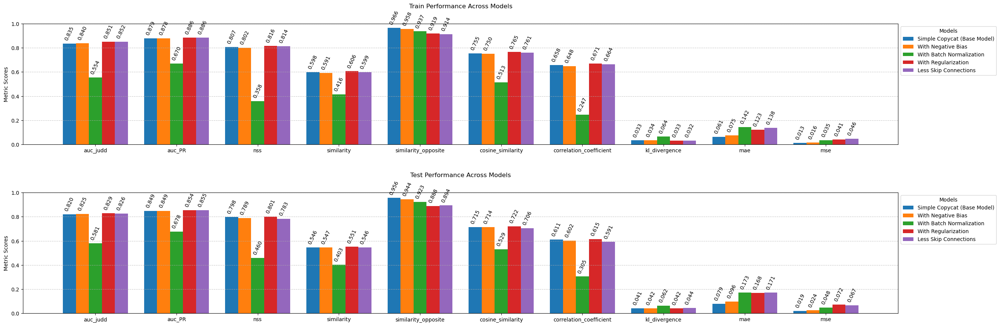

(                                     auc_judd            auc_PR  \
 Model Name                                                        
 Simple Copycat (Base Model) 0.834662199020386 0.878815650939941   
 With Negative Bias          0.839870274066925 0.877856373786926   
 With Batch Normalization    0.554471373558044 0.669616580009460   
 With Regularization         0.850595355033875 0.886318206787109   
 Less Skip Connections       0.851575970649719 0.885667145252228   
 
                                           nss        similarity  \
 Model Name                                                        
 Simple Copycat (Base Model) 0.807180345058441 0.598050713539124   
 With Negative Bias          0.802336812019348 0.590863704681396   
 With Batch Normalization    0.357694745063782 0.415818989276886   
 With Regularization         0.816341757774353 0.606268286705017   
 Less Skip Connections       0.813603818416595 0.598780035972595   
 
                              similarity_opp

In [122]:
compare_train_test_performance({"Simple Copycat (Base Model)":UMSI_ours, "With Negative Bias":UMSI_nb, "With Batch Normalization":UMSI_bn, "With Regularization":UMSI_reg, "Less Skip Connections":UMSI_skip})

# Evaluate our final model's generalizability

Desktop category (baseline category).

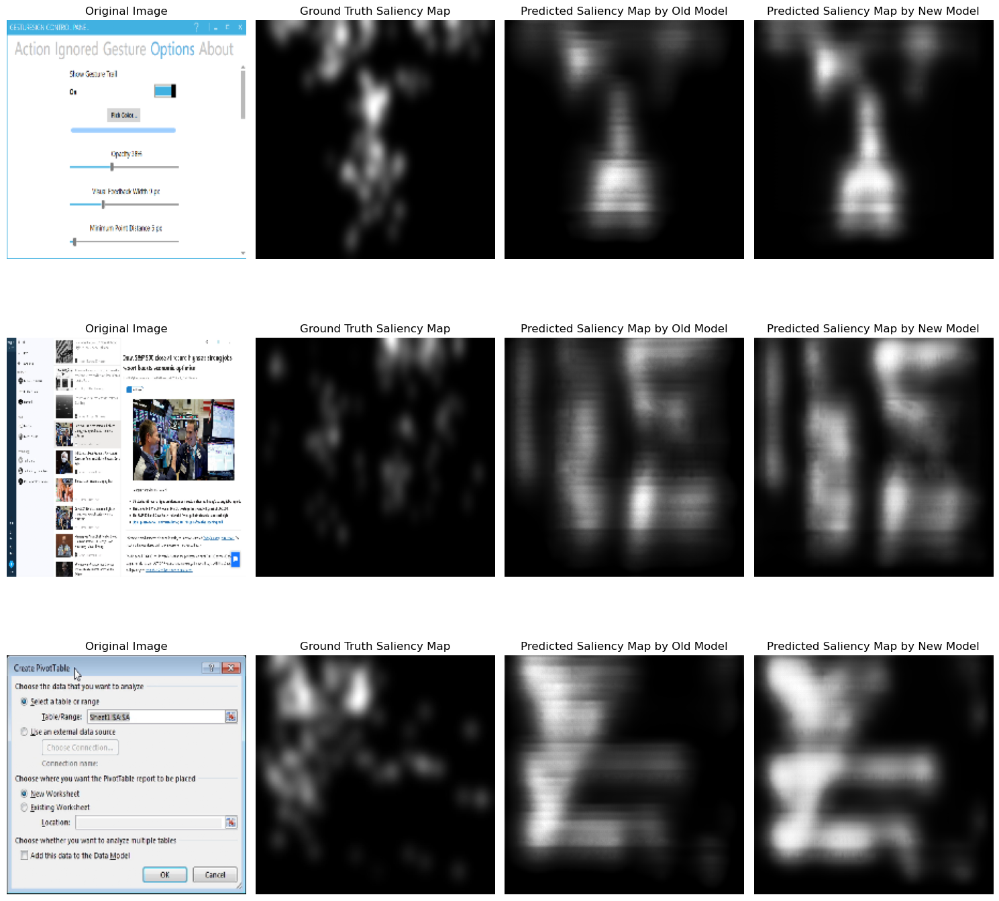

In [143]:
results_desktop_UEyes = test_data_performance(UMSI_ueyes, test_data_gen_desktop)
results_desktop_ours = test_data_performance(UMSI_ours, test_data_gen_desktop)
compare_2_models_visualized_results(UMSI_ueyes, UMSI_ours, test_data_gen_desktop, num_samples=3)

### Generalizability onto the 3 other categories

Poster category.

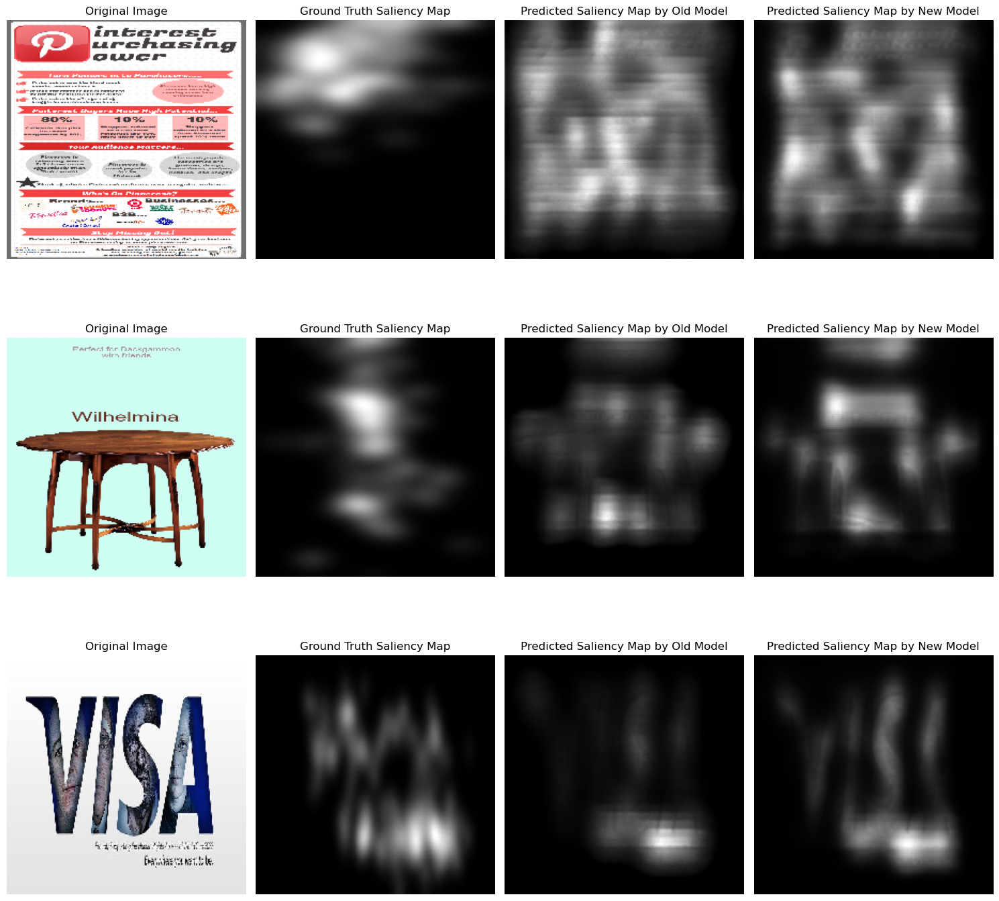

In [136]:
results_poster_UEyes = test_data_performance(UMSI_ueyes, test_data_gen_poster)
results_poster_ours = test_data_performance(UMSI_ours, test_data_gen_poster)
compare_2_models_visualized_results(UMSI_ueyes, UMSI_ours, test_data_gen_poster, num_samples=3)

Mobile category.

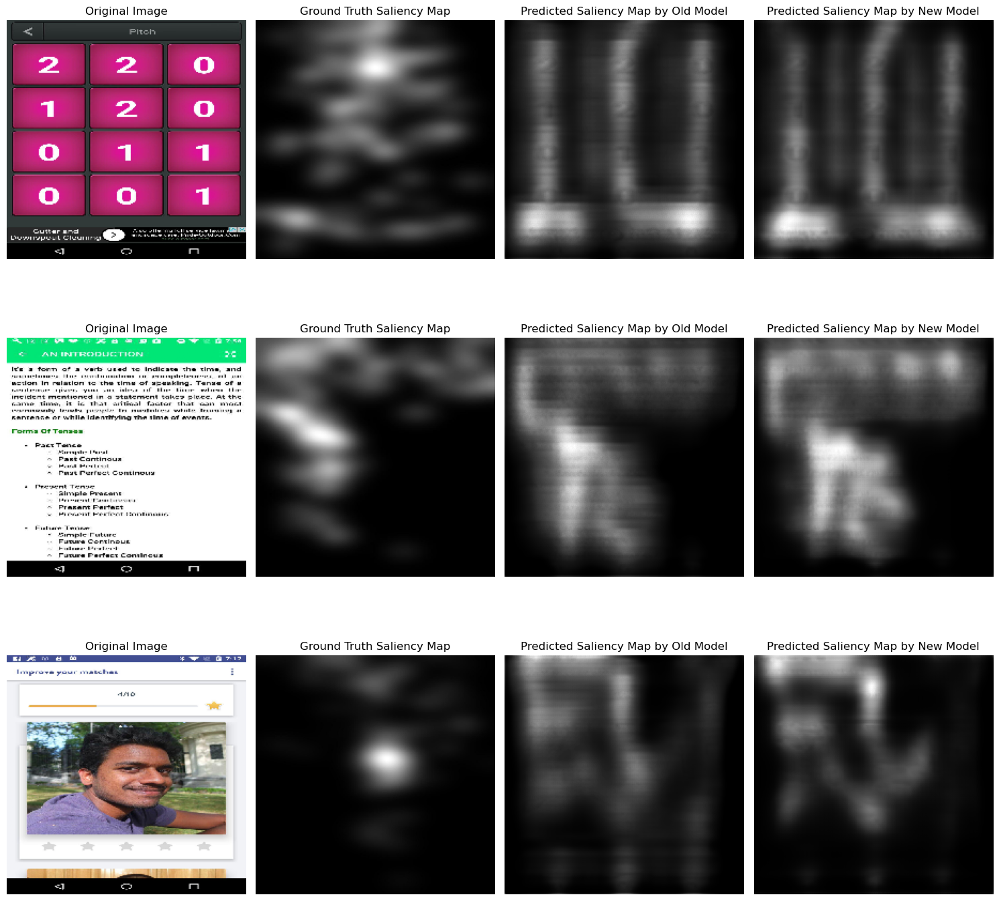

In [137]:
results_mobile_UEyes = test_data_performance(UMSI_ueyes, test_data_gen_mobile)
results_mobile_ours = test_data_performance(UMSI_ours, test_data_gen_mobile)
compare_2_models_visualized_results(UMSI_ueyes, UMSI_ours, test_data_gen_mobile, num_samples=3)

Web category.

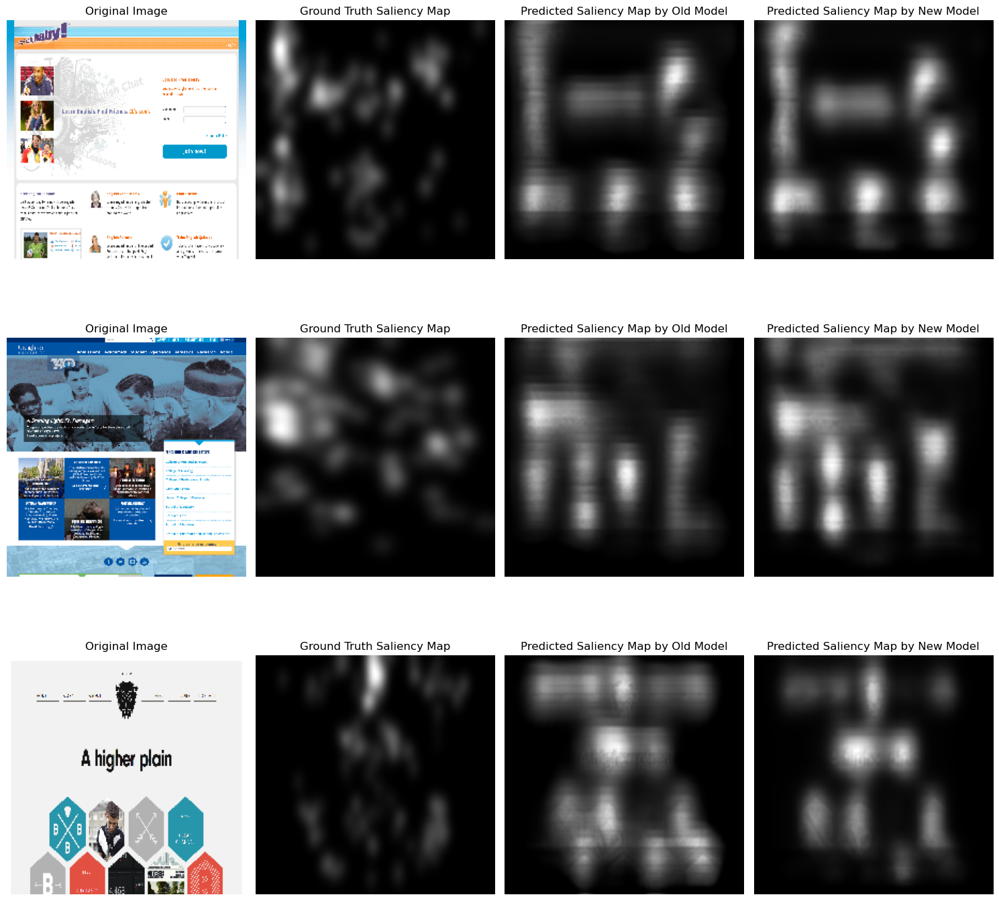

In [138]:
results_web_UEyes = test_data_performance(UMSI_ueyes, test_data_gen_web)
results_web_ours = test_data_performance(UMSI_ours, test_data_gen_web)
compare_2_models_visualized_results(UMSI_ueyes, UMSI_ours, test_data_gen_web, num_samples=3)

### Input images rotated by 90 degrees

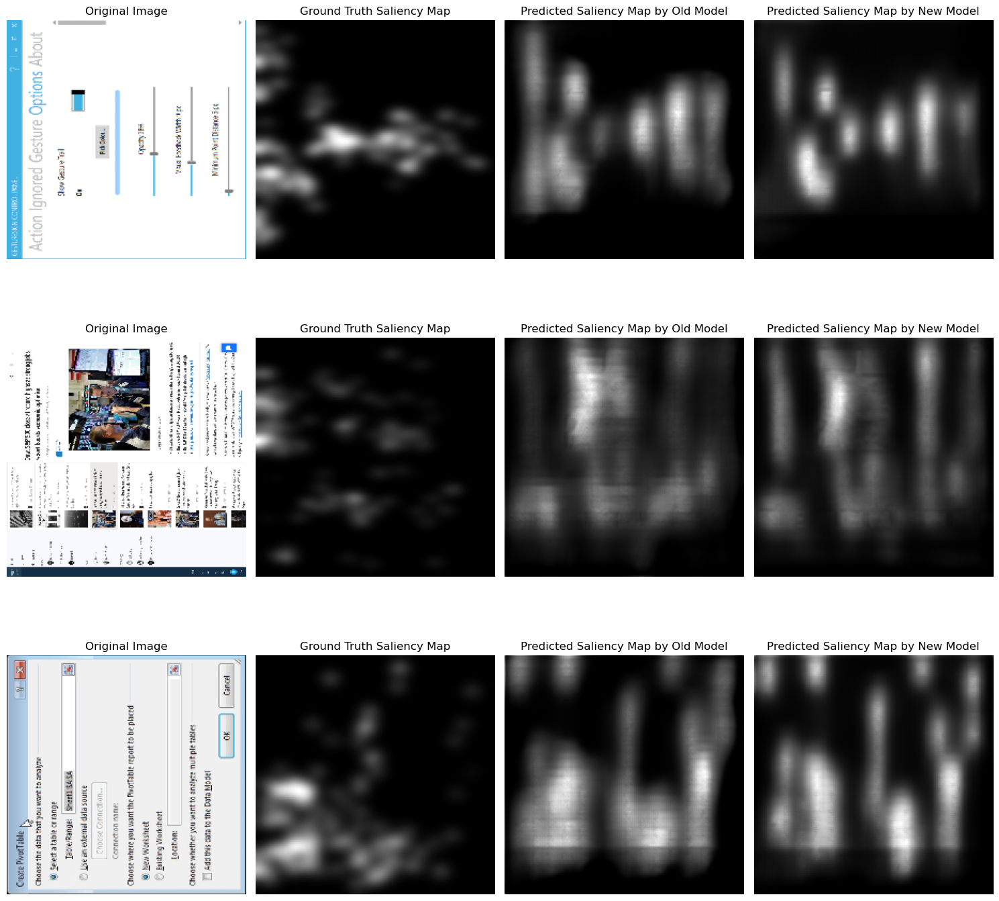

In [139]:
results_rotate_UEyes = test_data_performance(UMSI_ueyes, test_data_gen_rotated_90)
results_rotate_ours = test_data_performance(UMSI_ours, test_data_gen_rotated_90)
compare_2_models_visualized_results(UMSI_ueyes, UMSI_ours, test_data_gen_rotated_90, num_samples=3)

### Input images flipped horizontally.

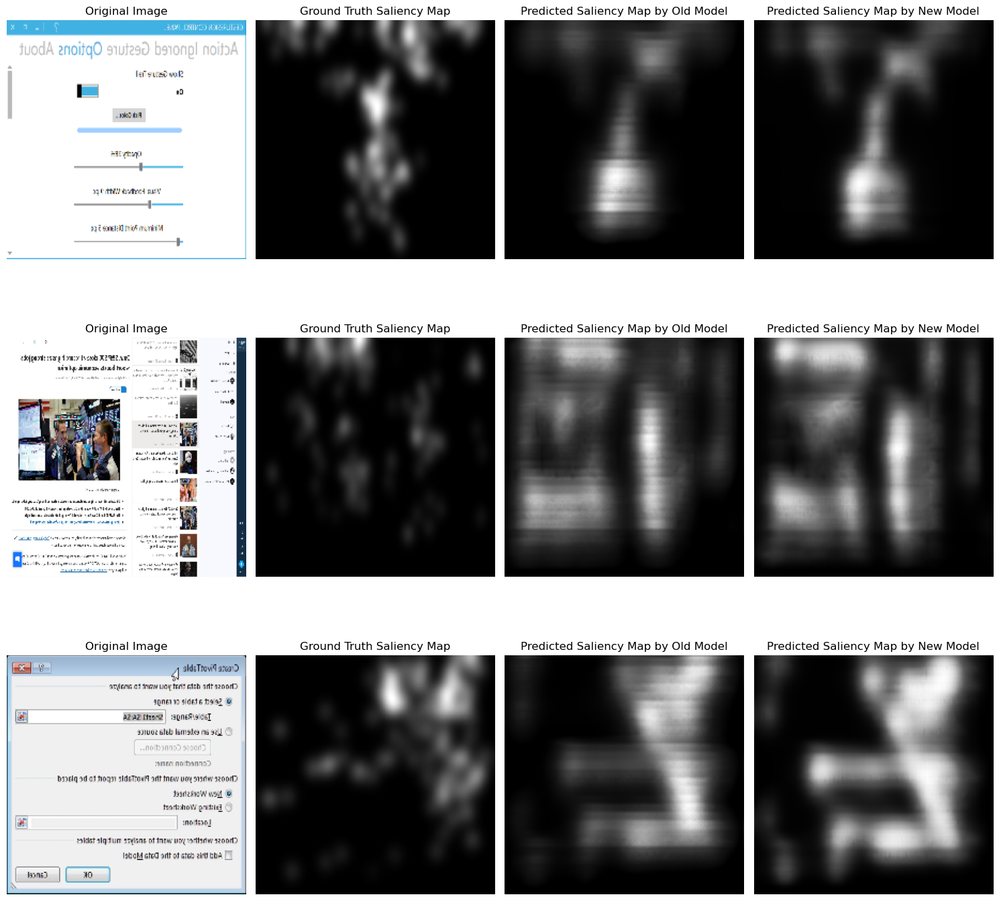

In [140]:
results_flip_h_UEyes = test_data_performance(UMSI_ueyes, test_data_gen_flip_horizontal)
results_flip_h_ours = test_data_performance(UMSI_ours, test_data_gen_flip_horizontal)
compare_2_models_visualized_results(UMSI_ueyes, UMSI_ours, test_data_gen_flip_horizontal, num_samples=3)

### Input images flipped vertically.

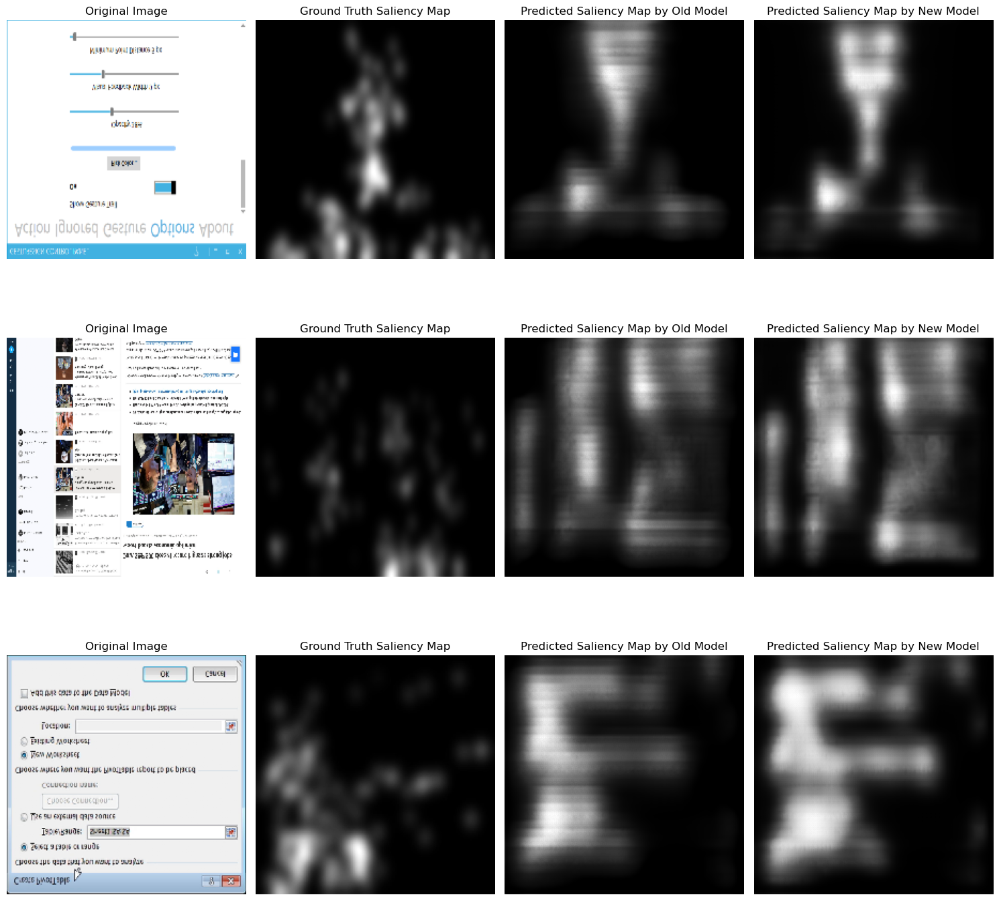

In [141]:
results_flip_v_UEyes = test_data_performance(UMSI_ueyes, test_data_gen_flip_vertical)
results_flip_v_ours = test_data_performance(UMSI_ours, test_data_gen_flip_vertical)
compare_2_models_visualized_results(UMSI_ueyes, UMSI_ours, test_data_gen_flip_vertical, num_samples=3)

## Compare generalization performance to baseline performance

In [153]:
# Define the generalization conditions
generalization_conditions = ['poster', 'mobile', 'web', 'rotate', 'flip_h', 'flip_v']

# Define the metrics to compare (excluding 'loss')
metrics = ['nss', 'cc', 'sim', 'sim_opposite', 'cosine_similarity', 'ig', 'auc_judd', 'auc_pr']

# Initialize an empty DataFrame to store all improvement results
generalizability_improvement_vals = pd.DataFrame()
desktop_df = globals()['results_desktop_ours']

# Iterate over each generalization condition
for condition in generalization_conditions:
    generalize_df = globals()[f'results_{condition}_ours']

    # Filter metrics to include in the DataFrame
    available_metrics = desktop_df.columns

    # Compute improvement
    improvement = (generalize_df.subtract(desktop_df.squeeze(axis=0), axis=1))

    # Add the improvement results to the consolidated DataFrame
    generalizability_improvement_vals = pd.concat([generalizability_improvement_vals, improvement], axis=0)

# Set the index of the consolidated DataFrame to the generalization conditions
generalizability_improvement_vals.index = generalization_conditions

# remove the loss column
generalizability_improvement_vals = generalizability_improvement_vals.drop('loss', axis=1)

# Display the consolidated DataFrame
print("Change in Performance Metrics in Our Model Across Generalization Conditions:")
display(generalizability_improvement_vals)

Change in Performance Metrics in Our Model Across Generalization Conditions:


,auc_judd,auc_PR,nss,similarity,similarity_opposite,cosine_similarity,correlation_coefficient,kl_divergence,mae,mse
poster,-0.030668199062347,-0.019461750984192,-0.116201102733612,0.006891548633575,-0.014599382877350,0.007454335689545,-0.045427799224854,-0.003185037523508,0.017040893435478,0.007847622036934
mobile,0.005529105663300,0.052208364009857,-0.046068668365479,0.075510203838348,0.000533759593964,0.076140165328979,0.062515258789062,-0.012873888015747,-0.001367501914501,-0.000135937705636
web,0.004988372325897,-0.016632974147797,-0.079164803028107,-0.006524443626404,-0.007225692272186,-0.042336463928223,-0.080817878246307,0.000263061374426,0.010392397642136,0.002006692811847
rotate,-0.089112520217896,-0.095866262912750,-0.302397996187210,-0.116104334592819,-0.002042293548584,-0.195162117481232,-0.296847909688950,0.026108525693417,-0.003516182303429,0.000416016206145
flip_h,-0.014740169048309,-0.022599041461945,-0.068359375000000,-0.037714302539825,-0.000968158245087,-0.055506706237793,-0.084574282169342,0.005415130406618,0.003006406128407,0.001918351277709
flip_v,-0.082206904888153,-0.086097300052643,-0.232954084873199,-0.104279667139053,-0.008073151111603,-0.156007468700409,-0.232784986495972,0.030452184379101,0.015543974936008,0.007203951478004


In [167]:
# Initialize an empty DataFrame to store all improvement results
generalizability_improvement_percentages = pd.DataFrame()

# Initialize an empty DataFrame to store all improvement results
generalizability_improvement_percentages = pd.DataFrame()
desktop_df = globals()['results_desktop_ours']

# Iterate over each generalization condition
for condition in generalization_conditions:
    generalize_df = globals()[f'results_{condition}_ours']

    # Filter metrics to include in the DataFrame
    available_metrics = desktop_df.columns

    # Compute improvement
    improvement = (generalize_df.subtract(desktop_df.squeeze(axis=0), axis=1))
    improvement = (improvement.divide(desktop_df.squeeze(axis=0), axis=1))
    improvement *= 100

    # Add the improvement results to the consolidated DataFrame
    generalizability_improvement_percentages = pd.concat([generalizability_improvement_percentages, improvement], axis=0)


# Set the index of the consolidated DataFrame to the generalization conditions
generalizability_improvement_percentages.index = generalization_conditions
generalizability_improvement_percentages = generalizability_improvement_percentages.drop('loss', axis=1) # remove the loss column
generalizability_improvement_percentages['kl_divergence'] *=-1 # negate the KLD scale (bc lower is better)
generalizability_improvement_percentages['mae'] *=-1 # negate
generalizability_improvement_percentages['mse'] *=-1 # negate 

# Display the consolidated DataFrame
print("Percent Improvement in Performance Metrics in Our Model Across Generalization Conditions:")
display(generalizability_improvement_percentages)

Percent Improvement in Performance Metrics in Our Model Across Generalization Conditions:


,auc_judd,auc_PR,nss,similarity,similarity_opposite,cosine_similarity,correlation_coefficient,kl_divergence,mae,mse
poster,-3.741465706448734,-2.291740115601224,-14.555298466226683,1.262522058729590,-1.527395839263908,1.042771621483482,-7.439153612677382,7.742813932006302,-21.596633886637761,-41.638356196333845
mobile,0.674541050960016,6.147853924782348,-5.770540917656845,13.833363598512721,0.055842235924374,10.651090448137571,10.237357327529999,31.296372099762728,1.733092123284535,0.721265955616364
web,0.608572546121780,-1.958634355522580,-9.916148031191071,-1.195268935510490,-0.755956084243890,-5.922360486157051,-13.234552876953218,-0.639501186357791,-13.170718303671039,-10.647224048642190
rotate,-10.871568876041964,-11.288838328492576,-37.878238558407027,-21.270151504612556,-0.213665926489418,-27.300825475768775,-48.611142020063355,-63.469725235913131,4.456204257913206,-2.207322280991602
flip_h,-1.798274391312925,-2.661175242378852,-8.562664920407039,-6.909207410095219,-0.101289272821843,-7.764718477593288,-13.849693083864903,-13.164161127311585,-3.810143682640647,-10.178496547745066
flip_v,-10.029096095503663,-10.138483250344080,-29.179725101484166,-19.103888986375647,-0.844617715776302,-21.823562538031567,-38.120342671611056,-74.029142743293903,-19.699526735913050,-38.223132593609357


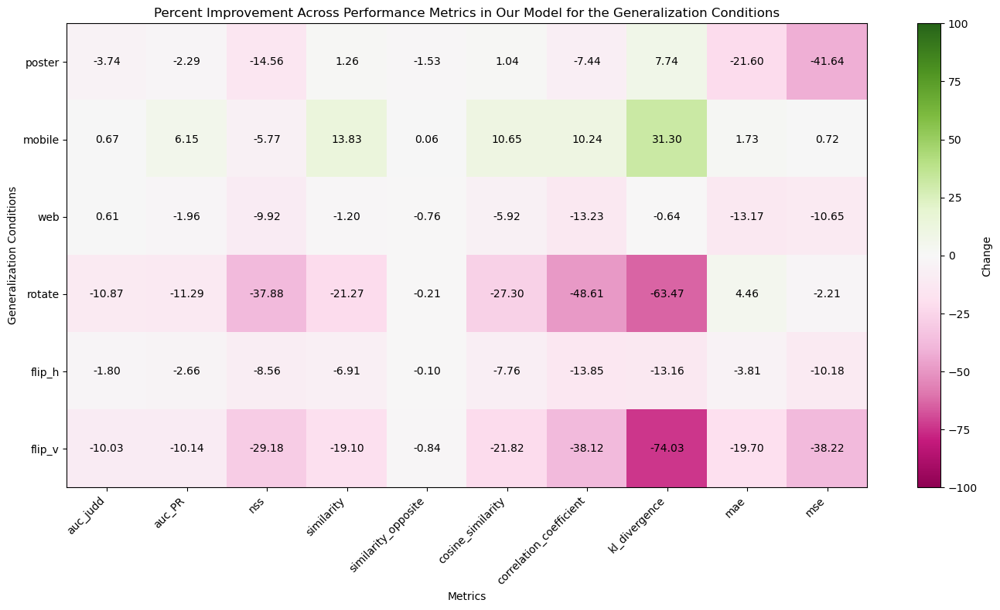

In [168]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(14,8))

# Create the heatmap using imshow
cax = ax.imshow(generalizability_improvement_percentages, cmap='PiYG', aspect='auto', vmin=-100, vmax=100)

# Add colorbar
cbar = fig.colorbar(cax)
cbar.set_label('Change')

# Set ticks and labels
ax.set_xticks(np.arange(len(generalizability_improvement_percentages.columns)))
ax.set_yticks(np.arange(len(generalizability_improvement_percentages.index)))
ax.set_xticklabels(generalizability_improvement_percentages.columns, rotation=45, ha='right')
ax.set_yticklabels(generalizability_improvement_percentages.index)

# Add annotations (values in each cell)
for i in range(len(generalizability_improvement_percentages.index)):
    for j in range(len(generalizability_improvement_percentages.columns)):
        ax.text(j, i, f"{generalizability_improvement_percentages.iloc[i, j]:.2f}", ha='center', va='center', color='black')

# Add title and labels
ax.set_title("Percent Improvement Across Performance Metrics in Our Model for the Generalization Conditions")
ax.set_xlabel("Metrics")
ax.set_ylabel("Generalization Conditions")

# Display the heatmap
plt.tight_layout()
plt.show()

### compare generalization performance between UEyes' and our model

In [162]:
# Initialize an empty DataFrame to store all improvement results
generalizability_improvement_vals = pd.DataFrame()

# Iterate over each generalization condition
for condition in generalization_conditions:
    # Extract the Test row for UEyes and ours models
    ueyes_df = globals()[f'results_{condition}_UEyes']
    ours_df = globals()[f'results_{condition}_ours']

    # Filter metrics to include in the DataFrame
    available_metrics = ueyes_df.columns

    # Compute improvement
    improvement = (ours_df.subtract(ueyes_df.squeeze(axis=0), axis=1))

    # Add the improvement results to the consolidated DataFrame
    generalizability_improvement_vals = pd.concat([generalizability_improvement_vals, improvement], axis=0)

# Set the index of the consolidated DataFrame to the generalization conditions
generalizability_improvement_vals.index = generalization_conditions

# remove the loss column
generalizability_improvement_vals = generalizability_improvement_vals.drop('loss', axis=1)
generalizability_improvement_vals = generalizability_improvement_vals.drop('information_gain', axis=1)

# Display the consolidated DataFrame
print("Change in Performance Metrics from UEyes' Model to Our Model Across Generalization Conditions:")
display(generalizability_improvement_vals)

Change in Performance Metrics from UEyes' Model to Our Model Across Generalization Conditions:


,auc_PR,auc_judd,correlation_coefficient,cosine_similarity,kl_divergence,mae,mse,nss,similarity,similarity_opposite
poster,0.004223287105560,0.010037660598755,-0.024416327476501,-0.012223124504089,-0.005140919238329,0.001285098493099,-0.000488154590130,-0.019082367420197,0.004567980766296,0.002009510993958
mobile,0.001214861869812,0.008907794952393,0.002499938011169,0.003241419792175,-0.005819547921419,0.002731584012508,-0.000019989907742,0.000077426433563,0.008513927459717,0.001553475856781
web,0.010898709297180,0.012157082557678,0.030044764280319,0.019529283046722,-0.001492992043495,0.012123472988605,0.004640026018023,0.027263104915619,0.015079438686371,-0.009011209011078
rotate,0.025856792926788,0.028396546840668,0.009331405162811,0.006437540054321,-0.020227149128914,0.002947978675365,-0.000875812023878,0.024230152368546,0.012719064950943,0.001314461231232
flip_h,0.013641476631165,0.019394934177399,0.006157934665680,0.007027387619019,-0.008797425776720,0.011374674737453,0.003616129979491,0.003679096698761,0.007870912551880,-0.004344522953033
flip_v,0.035659670829773,0.031305968761444,0.053271025419235,0.037205398082733,-0.016454838216305,0.010947920382023,0.003995059058070,0.065301418304443,0.030551880598068,-0.005166649818420


In [169]:
# Initialize an empty DataFrame to store all improvement results
generalizability_improvement_percentages = pd.DataFrame()

# Iterate over each generalization condition
for condition in generalization_conditions:
    # Extract the Test row for UEyes and ours models
    ueyes_df = globals()[f'results_{condition}_UEyes']
    ours_df = globals()[f'results_{condition}_ours']

    # Filter metrics to include in the DataFrame
    available_metrics = ueyes_df.columns

    # Compute improvement
    improvement = (ours_df.subtract(ueyes_df.squeeze(axis=0), axis=1))
    improvement = (improvement.divide(ueyes_df.squeeze(axis=0), axis=1))
    improvement *= 100

    # Add the improvement results to the consolidated DataFrame
    generalizability_improvement_percentages = pd.concat([generalizability_improvement_percentages, improvement], axis=0)

# Set the index of the consolidated DataFrame to the generalization conditions
generalizability_improvement_percentages.index = generalization_conditions

# remove the loss column
generalizability_improvement_percentages = generalizability_improvement_percentages.drop('loss', axis=1)
generalizability_improvement_percentages = generalizability_improvement_percentages.drop('information_gain', axis=1)
generalizability_improvement_percentages['kl_divergence'] *=-1 # negate the KLD scale (bc lower is better)
generalizability_improvement_percentages['mae'] *=-1 # negate
generalizability_improvement_percentages['mse'] *=-1 # negate 

# Display the consolidated DataFrame
print("Percent Change in Performance Metrics from UEyes' Model to Our Model Across Generalization Conditions:")
display(generalizability_improvement_percentages)

Percent Change in Performance Metrics from UEyes' Model to Our Model Across Generalization Conditions:


,auc_PR,auc_judd,correlation_coefficient,cosine_similarity,kl_divergence,mae,mse,nss,similarity,similarity_opposite
poster,0.511586305270346,1.288567540224312,-4.140840201240722,-1.664062013757663,11.930299981983584,-1.357577999559236,1.795816618066912,-2.721295849175733,0.833300532504244,0.213953928765031
mobile,0.134953713696842,1.091233129653228,0.372750384508259,0.411474744490996,17.075606939448974,-3.651545871582019,0.106720126170794,0.010293382804963,1.389230642047472,0.162699111019748
web,1.326391557751676,1.496227996032203,6.011411207455060,2.990737619497104,3.480861351028138,-15.709221104305094,-28.617818950431257,3.940242567513843,2.876373175967764,-0.941000068155485
rotate,3.554248322423140,4.044083880011633,3.064713704098667,1.254249629400381,23.124386028855291,-4.069480179140190,4.348851517258040,5.136617787352873,3.049899230216328,0.138004341945886
flip_h,1.677975560823296,2.468965595734228,1.184386861723897,1.077285109946128,15.894761610984029,-16.125815079933368,-21.086142228535312,0.506550649812775,1.573331382535226,-0.452926586546423
flip_v,4.901970423814332,4.433198084977135,16.411174199109226,7.132320477088474,18.689669856291697,-13.111065803603255,-18.113260289058054,13.058017197485025,7.433110769230324,-0.542186557661411


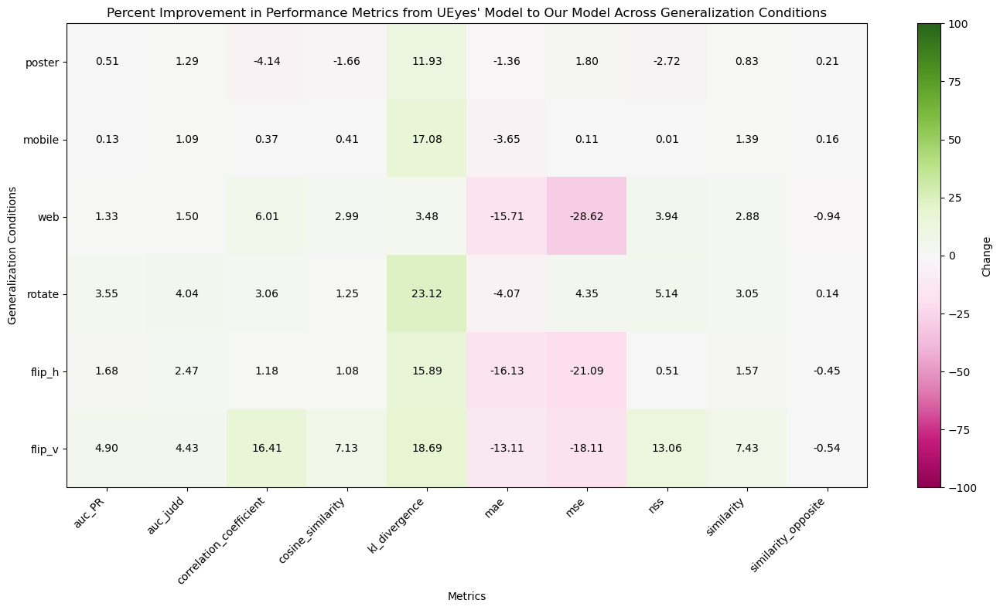

In [171]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(14,8))

# Create the heatmap using imshow
cax = ax.imshow(generalizability_improvement_percentages, cmap='PiYG', aspect='auto', vmin=-100, vmax=100)

# Add colorbar
cbar = fig.colorbar(cax)
cbar.set_label('Change')

# Set ticks and labels
ax.set_xticks(np.arange(len(generalizability_improvement_percentages.columns)))
ax.set_yticks(np.arange(len(generalizability_improvement_percentages.index)))
ax.set_xticklabels(generalizability_improvement_percentages.columns, rotation=45, ha='right')
ax.set_yticklabels(generalizability_improvement_percentages.index)

# Add annotations (values in each cell)
for i in range(len(generalizability_improvement_percentages.index)):
    for j in range(len(generalizability_improvement_percentages.columns)):
        ax.text(j, i, f"{generalizability_improvement_percentages.iloc[i, j]:.2f}", ha='center', va='center', color='black')

# Add title and labels
ax.set_title("Percent Improvement in Performance Metrics from UEyes' Model to Our Model Across Generalization Conditions")
ax.set_xlabel("Metrics")
ax.set_ylabel("Generalization Conditions")

# Display the heatmap
plt.tight_layout()
plt.show()